# Newsgroups Preprocessing

In [134]:
import csv
import json
import re
import os
import math
import random
import nltk
import community
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
from community import best_partition
from fa2_modified import ForceAtlas2
from collections import defaultdict, Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

newsgroups = os.listdir("./newsgroups")
for title in newsgroups:
    if ".csv" not in title:
        title_san = title.replace(".txt","")
        input_file = './newsgroups/' + title 
        csv_output_file = title_san + '.csv'
        json_output_file = title_san + '.json'
        
        posts = []
        newsgroup_pattern = re.compile(r'^Newsgroup: (.+)$', re.MULTILINE)
        document_id_pattern = re.compile(r'^document_id: (\d+)$', re.MULTILINE)
        from_pattern = re.compile(r'^From: (.+)$', re.MULTILINE)
        subject_pattern = re.compile(r'^Subject: (.+)$', re.MULTILINE)
        
        with open(input_file, 'r', encoding='ISO-8859-1') as file:
            content = file.read()
        if content.startswith("From: "):
            content = "\nNewsgroup:" + content

        raw_posts = re.split(r'(?=\nNewsgroup: )', content)
        for raw_post in raw_posts:
            if not raw_post.strip():
                continue
        
            post = {}
            post['newsgroup'] = title_san
            post['document_id'] = document_id_pattern.search(raw_post)
            post['sender'] = from_pattern.search(raw_post)
            post['subject'] = subject_pattern.search(raw_post)
            if title_san == "alt.atheism":
                print(post)
            post['document_id'] = post['document_id'].group(1) if post['document_id'] else ''
            post['sender'] = post['sender'].group(1) if post['sender'] else ''
            post['subject'] = post['subject'].group(1) if post['subject'] else ''
            content_start = post['subject'] and raw_post.find(post['subject']) + len(post['subject'])
            post['content'] = raw_post[content_start:].strip() if content_start else ''
            posts.append(post)
        
        with open(json_output_file, 'w', encoding='utf-8') as jsonfile:
            json.dump(posts, jsonfile, ensure_ascii=False, indent=4)

    print(f"Data has been converted and saved to {json_output_file}.")

Data has been converted and saved to sci.crypt.json.
Data has been converted and saved to comp.sys.mac.hardware.json.
Data has been converted and saved to misc.forsale.json.
Data has been converted and saved to .DS_Store.json.
Data has been converted and saved to soc.religion.christian.json.
Data has been converted and saved to rec.sport.baseball.json.
Data has been converted and saved to rec.sport.hockey.json.
Data has been converted and saved to comp.sys.ibm.pc.hardware.json.
Data has been converted and saved to talk.politics.guns.json.
Data has been converted and saved to rec.autos.json.
{'newsgroup': 'alt.atheism', 'document_id': None, 'sender': <re.Match object; span=(11611, 11645), match='From: mathew <mathew@mantis.co.uk>'>, 'subject': <re.Match object; span=(46, 89), match='Subject: Alt.Atheism FAQ: Atheist Resources'>}
{'newsgroup': 'alt.atheism', 'document_id': <re.Match object; span=(24, 42), match='document_id: 49960'>, 'sender': <re.Match object; span=(43, 77), match='From

# The individual networks analysis

Import Data

In [135]:
newsgroups = [
    file for file in os.listdir("./newsgroups")
    if file.endswith(".txt") and not file.startswith(".")
]
#newsgroups.remove("list.csv")
graphs = {}
message_id_pattern = re.compile(r'<[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}>')
email_pattern = re.compile(r'\b[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}\b')
for title in newsgroups:
    G = nx.DiGraph()
    with open(title.replace(".txt","")+".json", 'r', encoding="utf-8") as file:
        data = json.load(file)
    for i,post in enumerate(data):
        if "alt.atheism" in title and i == 0:
            print("skipping first", i)
            continue
        sender_email = email_pattern.search(post["sender"].lower())
        if sender_email == None:
            continue
        sender_email = sender_email.group(0)
        G.add_node(sender_email)
        content = post["content"].lower()
        emails = email_pattern.findall(content)
        message_ids = message_id_pattern.findall(content)
        message_ids_san = [mes_id.strip('<>') for mes_id in message_ids]        
        emails_filtered = [email for email in emails if email not in message_ids_san]
        for email in emails_filtered:
            if email != sender_email:
                G.add_edge(sender_email,email)
            else:
                email = email
        
    graphs[title.replace(".txt","")] = G

skipping first 0


Individual network creation. Keeping only the largest component of each network for analysis. (This cell needs to be run several times until there are only nodes with degree >1).

Average number of nodes across all newsgroups: 246.35
Average number of edges across all newsgroups: 574.55

sci.crypt
The total number of nodes: 248
The total number of edges: 691


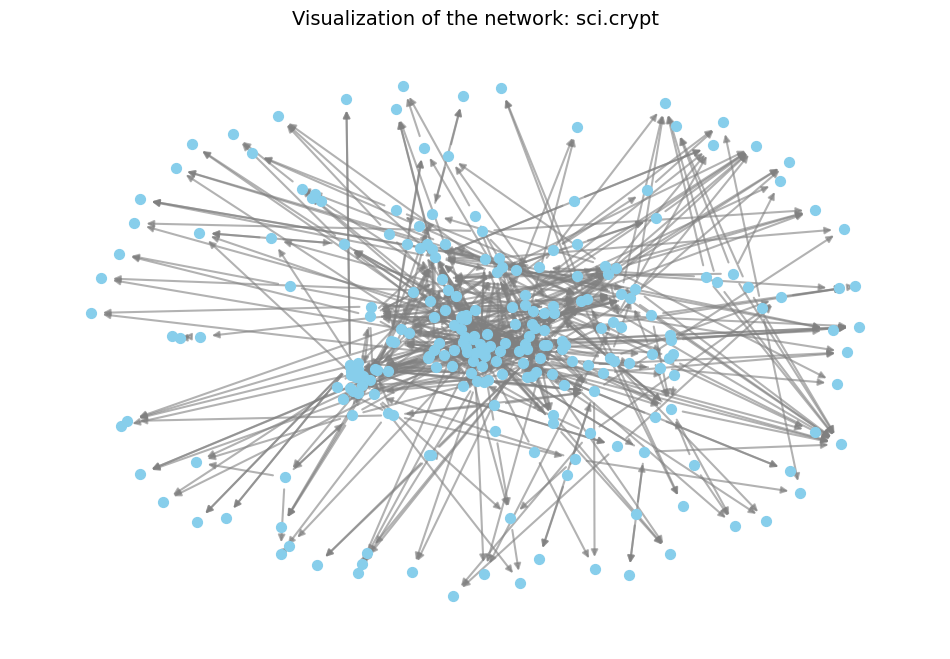

comp.sys.mac.hardware
The total number of nodes: 195
The total number of edges: 318


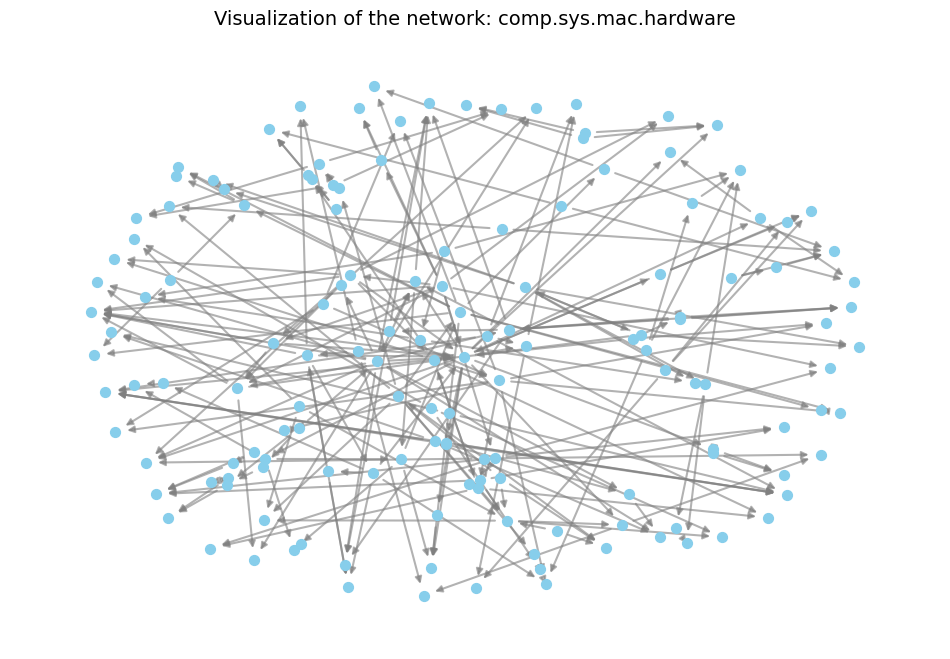

misc.forsale
The total number of nodes: 44
The total number of edges: 53


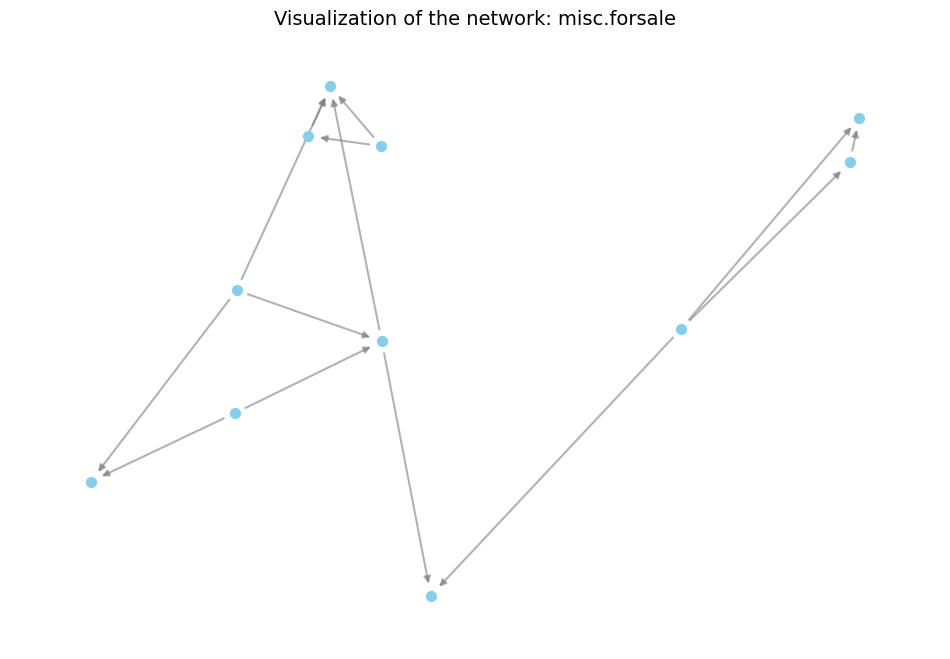

soc.religion.christian
The total number of nodes: 207
The total number of edges: 516


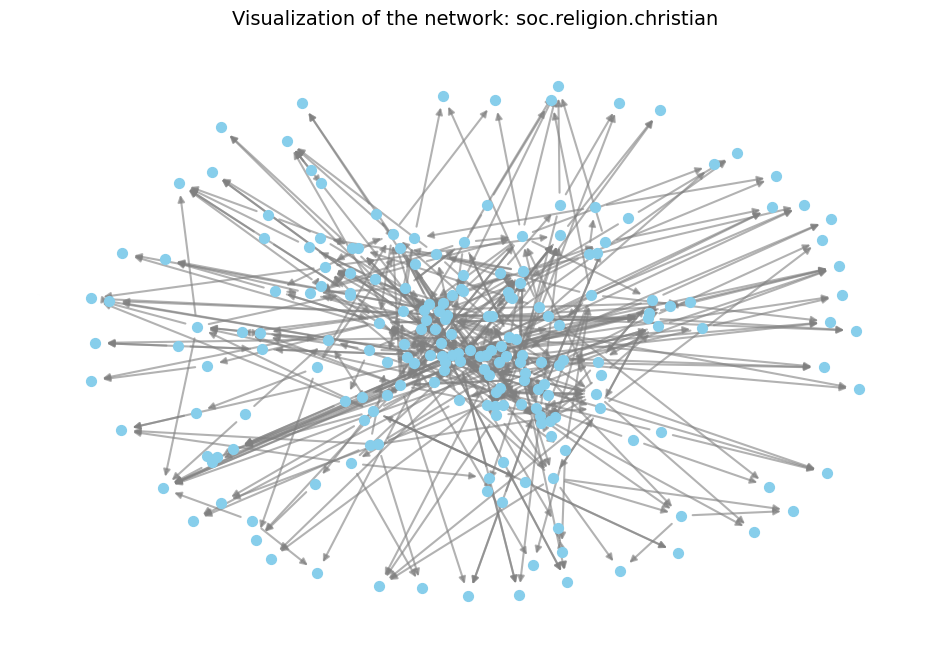

rec.sport.baseball
The total number of nodes: 251
The total number of edges: 609


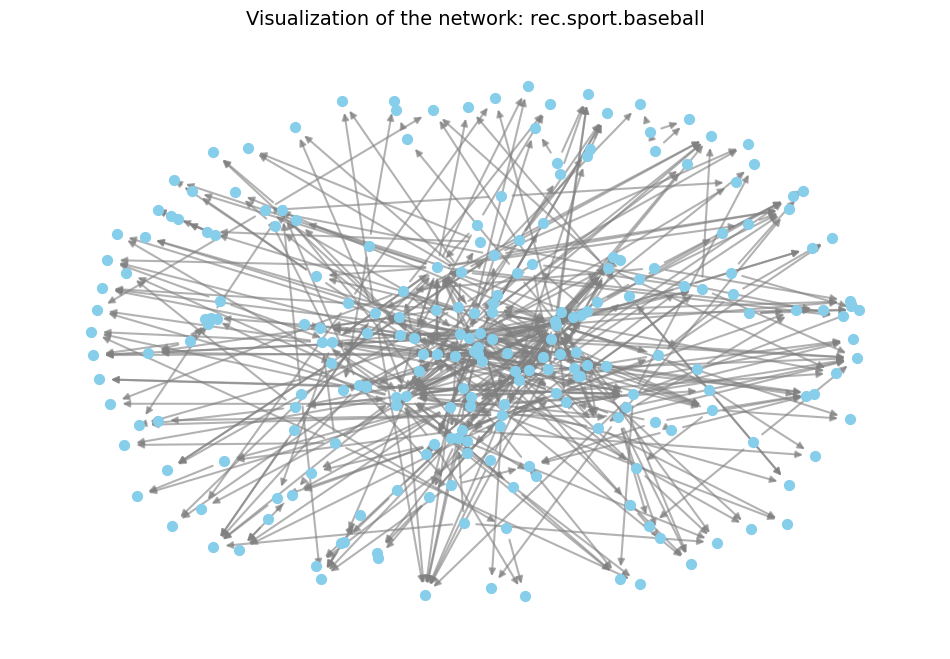

rec.sport.hockey
The total number of nodes: 244
The total number of edges: 544


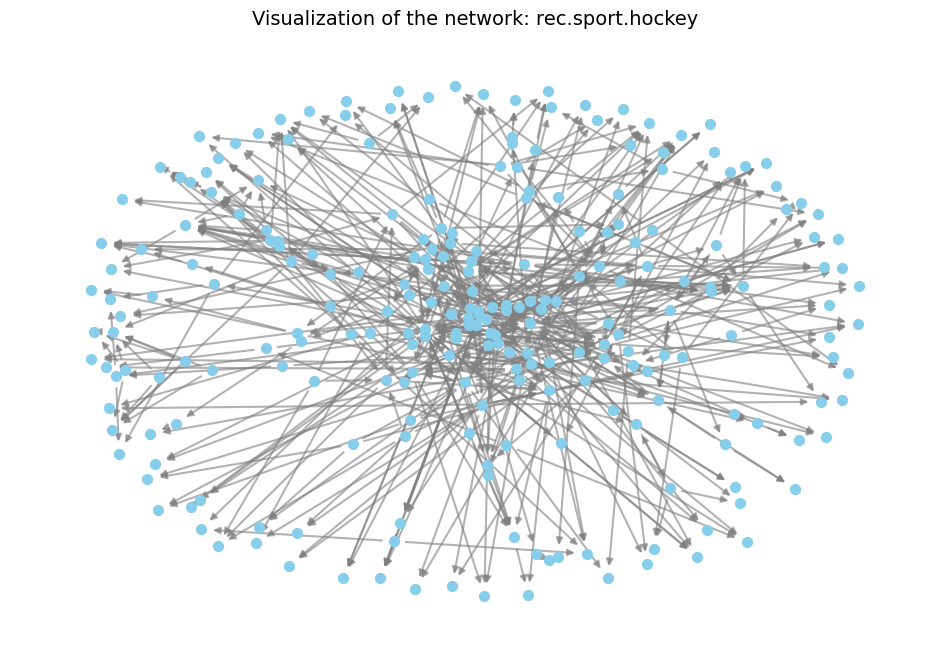

comp.sys.ibm.pc.hardware
The total number of nodes: 213
The total number of edges: 339


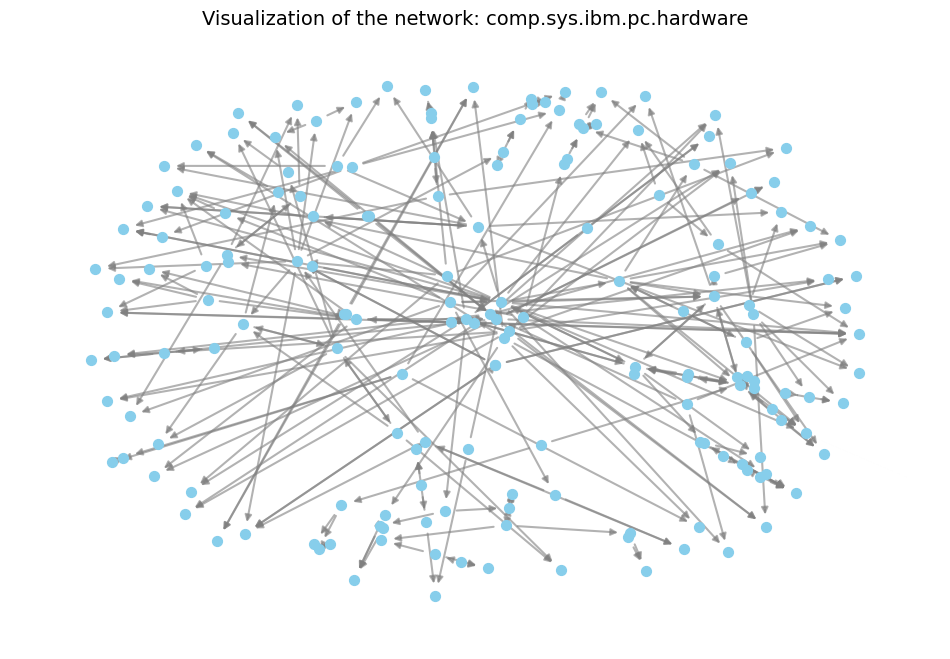

talk.politics.guns
The total number of nodes: 246
The total number of edges: 751


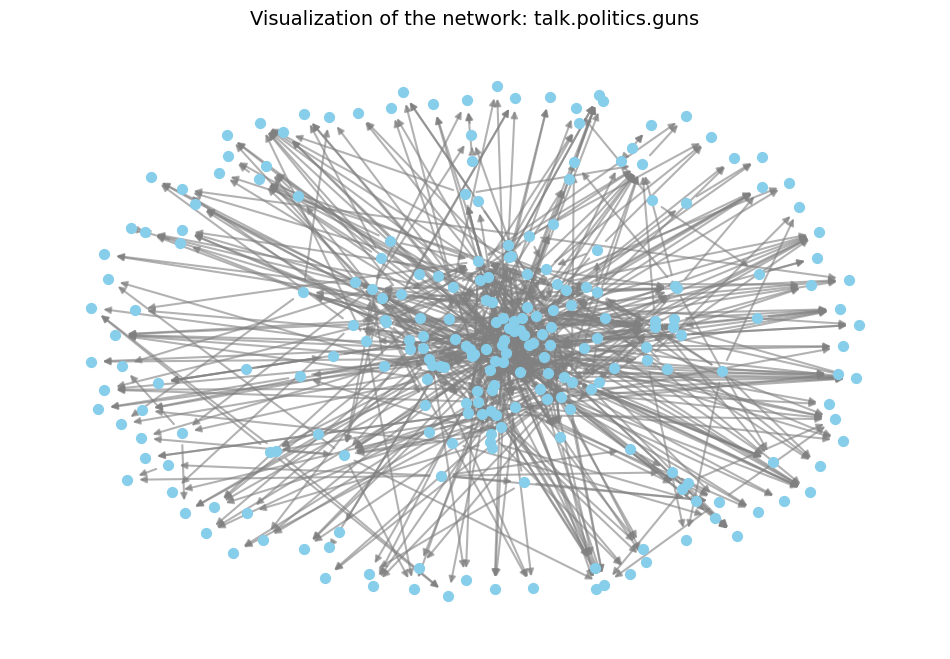

rec.autos
The total number of nodes: 281
The total number of edges: 665


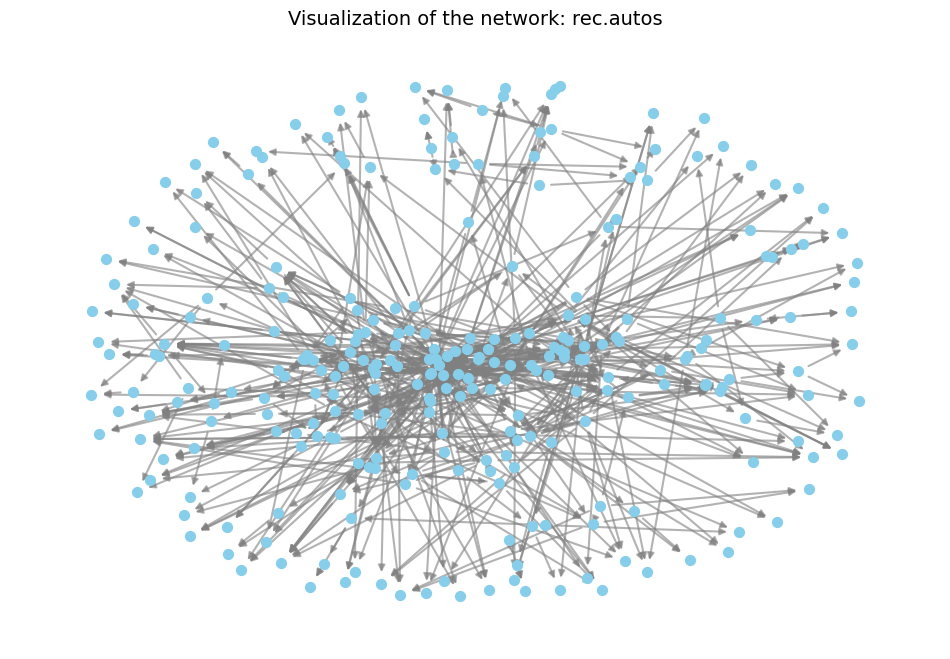

alt.atheism
The total number of nodes: 176
The total number of edges: 616


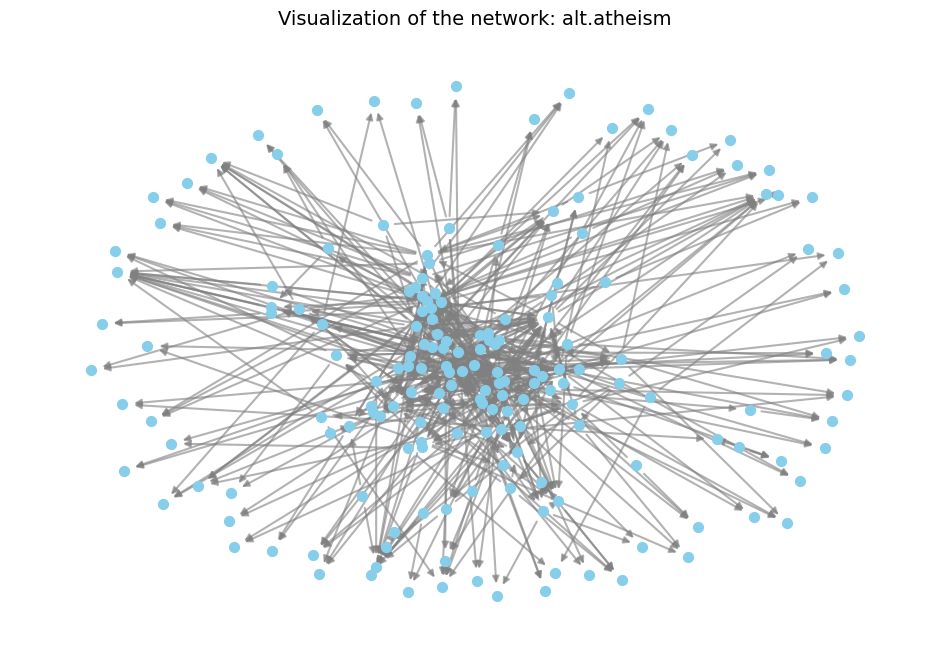

comp.os.ms-windows.misc
The total number of nodes: 286
The total number of edges: 470


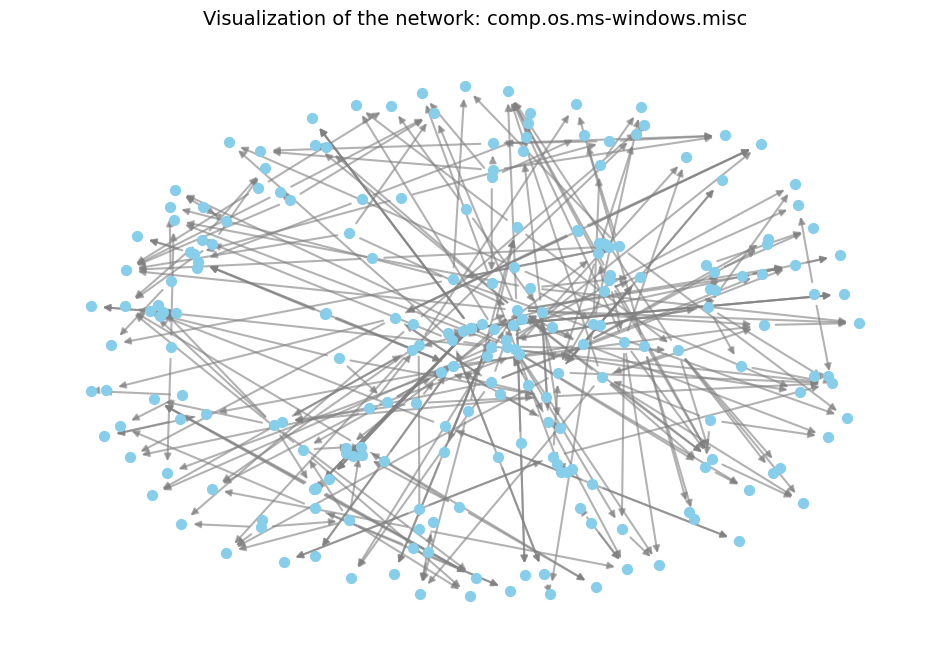

sci.electronics
The total number of nodes: 256
The total number of edges: 489


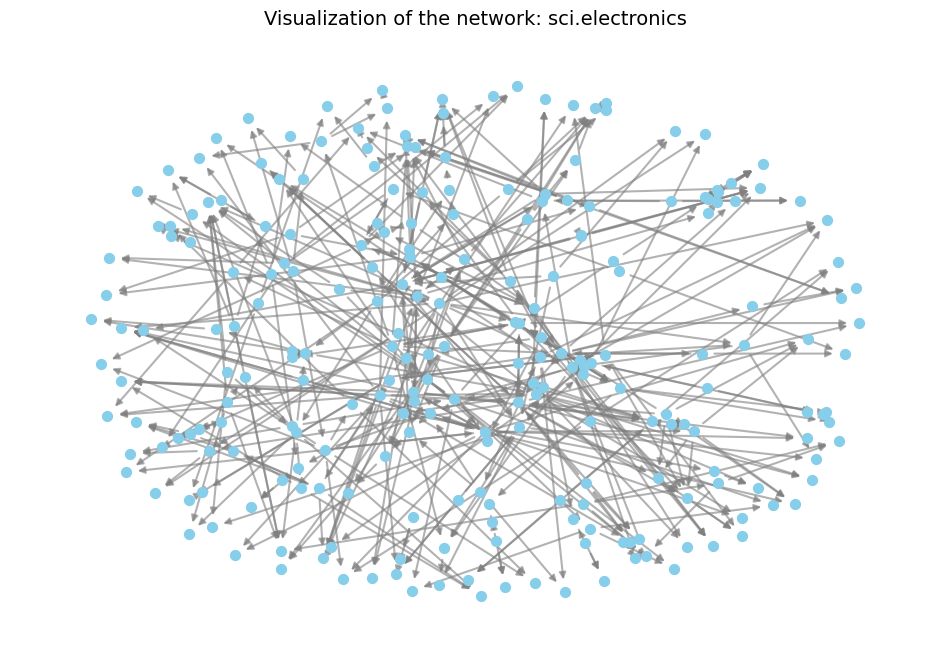

comp.windows.x
The total number of nodes: 198
The total number of edges: 313


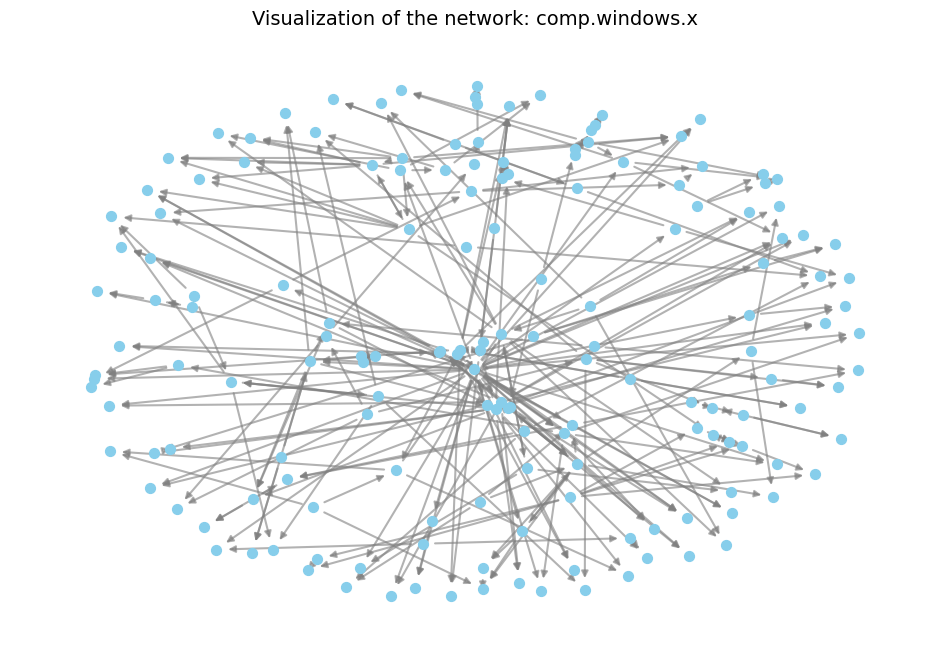

talk.religion.misc
The total number of nodes: 210
The total number of edges: 465


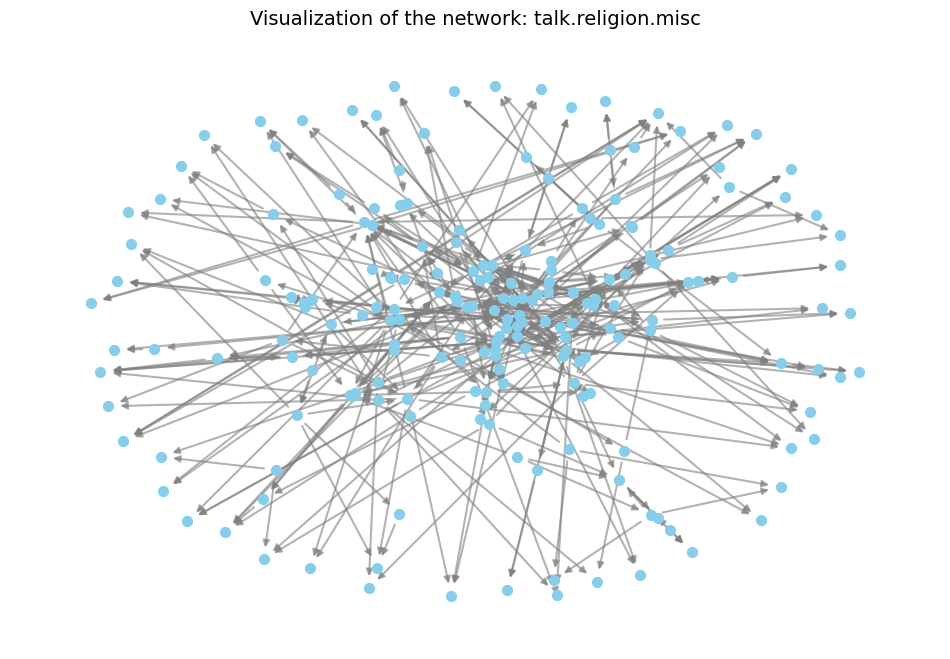

talk.politics.mideast
The total number of nodes: 184
The total number of edges: 609


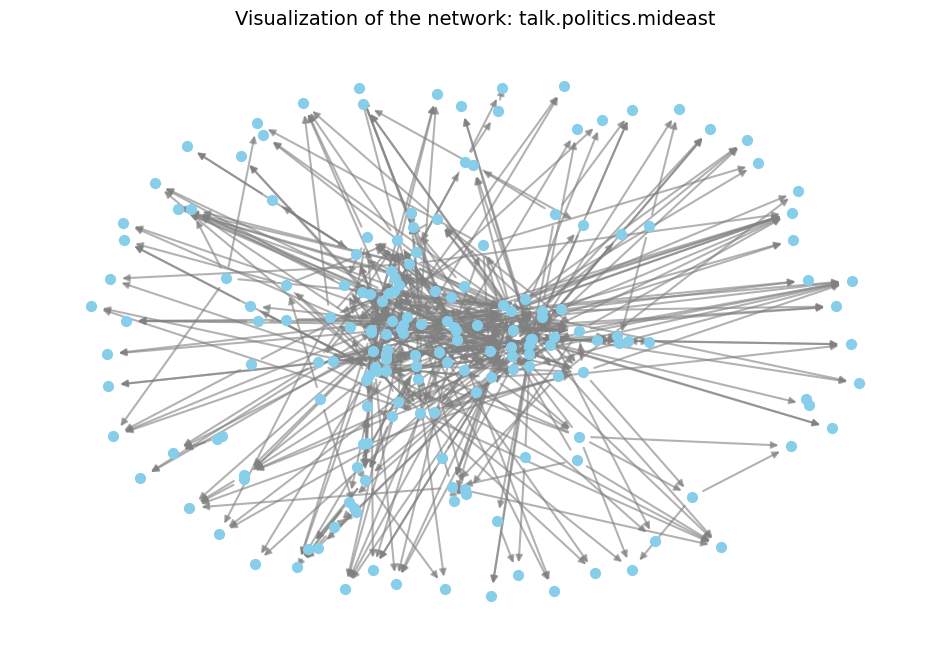

sci.med
The total number of nodes: 253
The total number of edges: 544


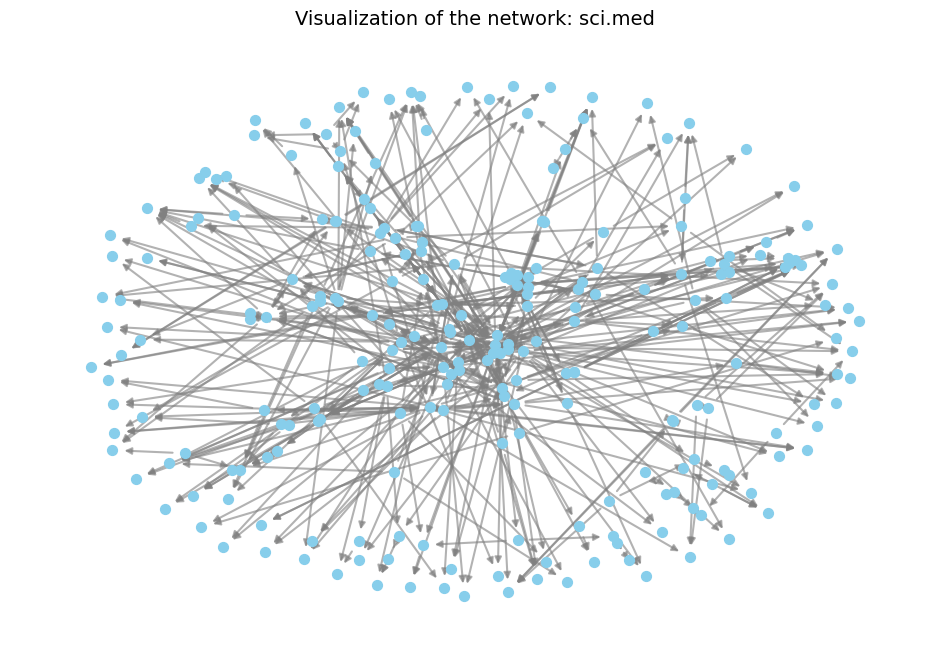

rec.motorcycles
The total number of nodes: 287
The total number of edges: 917


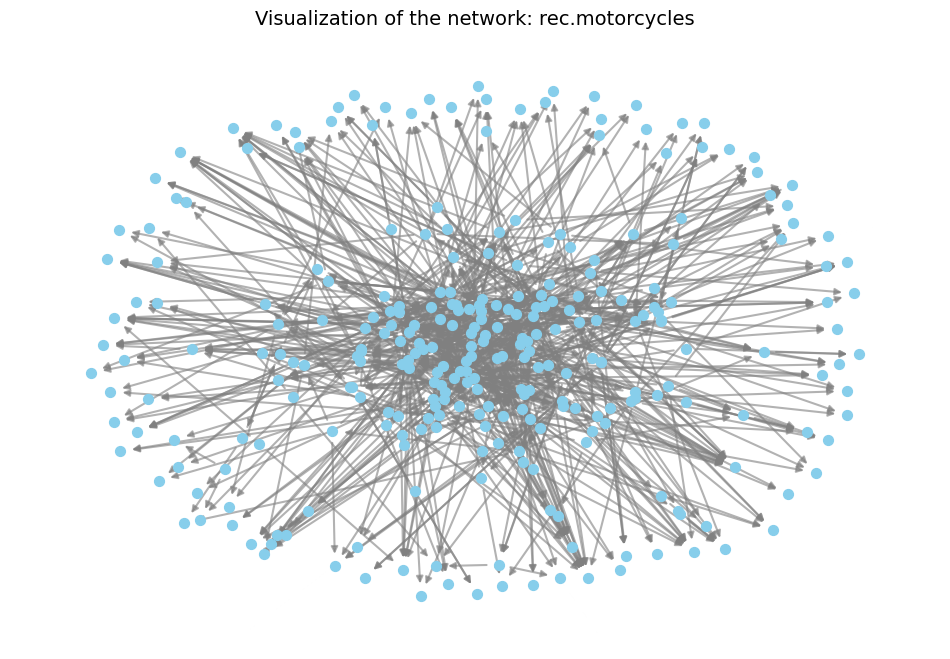

comp.graphics
The total number of nodes: 650
The total number of edges: 1240


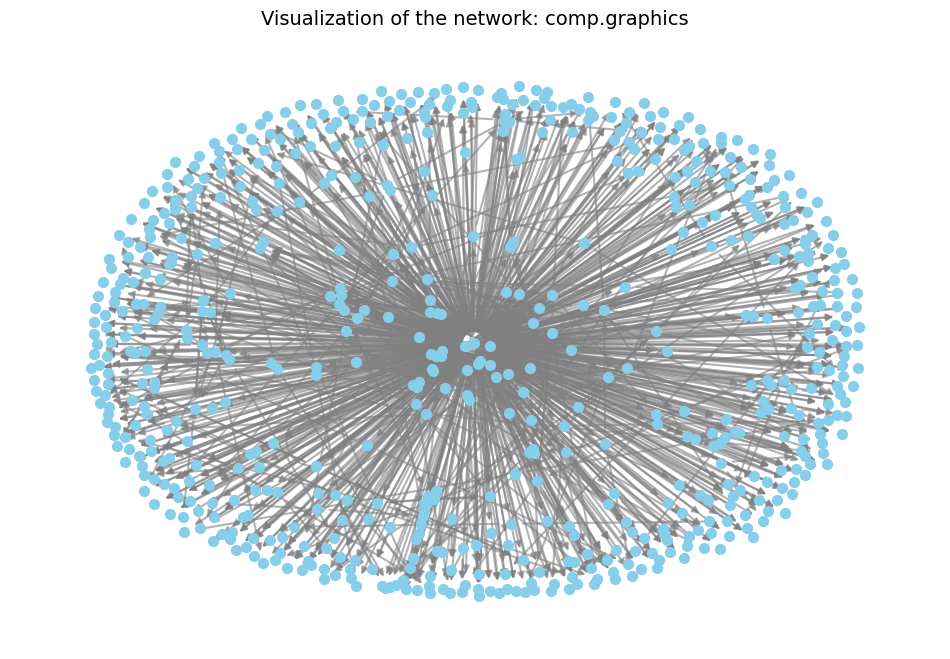

sci.space
The total number of nodes: 264
The total number of edges: 694


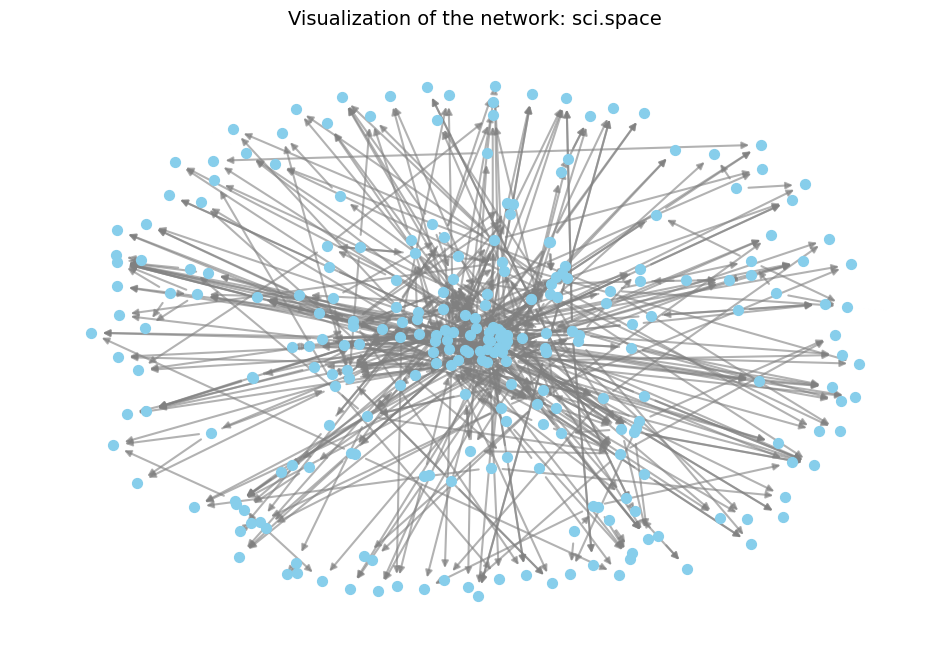

talk.politics.misc
The total number of nodes: 234
The total number of edges: 648


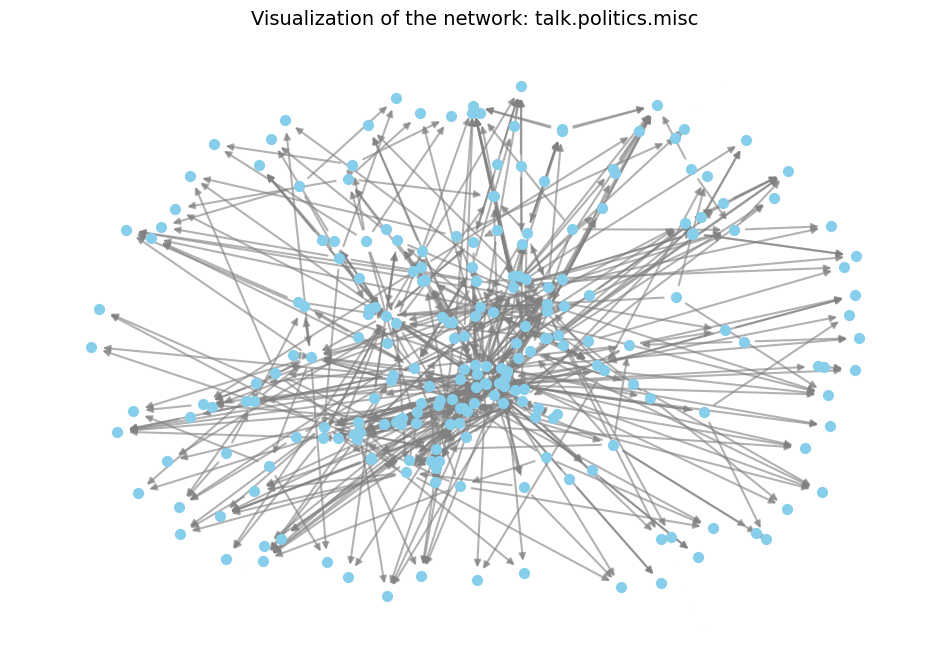

In [158]:
newsgroups_graphs = {}

total_nodes = 0
total_edges = 0
total_graphs = len(graphs)

for title, graph in graphs.items():
    total_nodes += len(graph.nodes())
    total_edges += len(graph.edges())

average_nodes = total_nodes / total_graphs if total_graphs > 0 else 0
average_edges = total_edges / total_graphs if total_graphs > 0 else 0
print(f"Average number of nodes across all newsgroups: {average_nodes:.2f}")
print(f"Average number of edges across all newsgroups: {average_edges:.2f}\n")

for title, graph in graphs.items():
    print(title)
    print("The total number of nodes:", len(graph.nodes()))
    print("The total number of edges:", len(graph.edges()))
    
    G = graph
    isolated = [node for node in G.nodes if G.degree(node) <= 1]
    G.remove_nodes_from(isolated)
    largest_component = max(nx.weakly_connected_components(G), key=len)
    G_largest = G.subgraph(largest_component).copy()
    pos = nx.spring_layout(G_largest)

    newsgroups_graphs[title] = G_largest

    
    plt.figure(figsize=(12, 8))
    nx.draw_networkx_nodes(G_largest, pos, node_size=50, node_color="skyblue")
    nx.draw_networkx_edges(G_largest, pos, alpha=0.6, width=1.5, edge_color="gray")

    plt.title(f"Visualization of the network: {title}", fontsize=14)
    plt.axis("off")
    plt.show()

Characteristics of these networks.

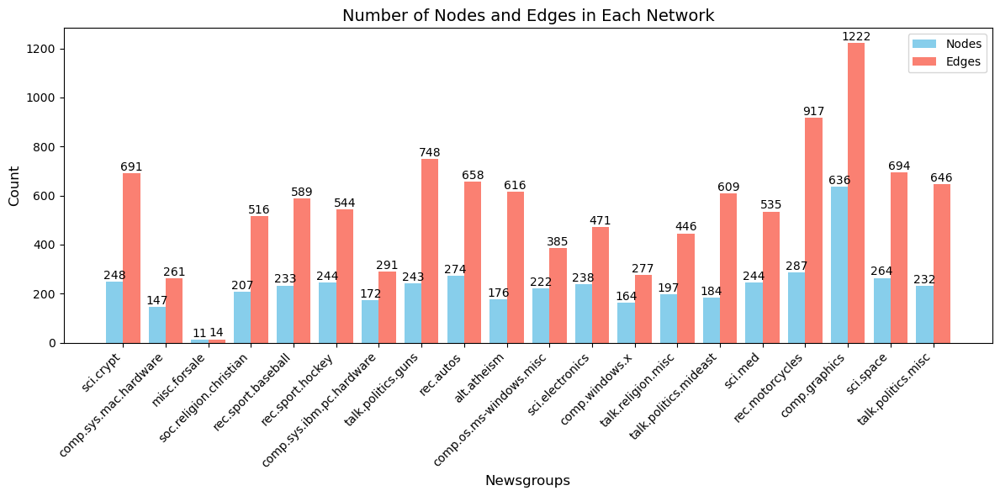

In [159]:
newsgroups = []
nodes_count = []
edges_count = []

for title, graph in newsgroups_graphs.items():
    newsgroups.append(title)
    nodes_count.append(len(graph.nodes()))
    edges_count.append(len(graph.edges()))

x = np.arange(len(newsgroups)) 
bar_width = 0.4

plt.figure(figsize=(12, 6))
bars_nodes = plt.bar(x - bar_width / 2, nodes_count, bar_width, color='skyblue', label='Nodes')
bars_edges = plt.bar(x + bar_width / 2, edges_count, bar_width, color='salmon', label='Edges')
plt.xlabel('Newsgroups', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Number of Nodes and Edges in Each Network', fontsize=14)
plt.xticks(x, newsgroups, rotation=45, ha='right')
plt.legend()
plt.tight_layout()

for bar in bars_nodes:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, int(yval), ha='center', va='bottom', fontsize=10)

for bar in bars_edges:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, int(yval), ha='center', va='bottom', fontsize=10)

plt.show()

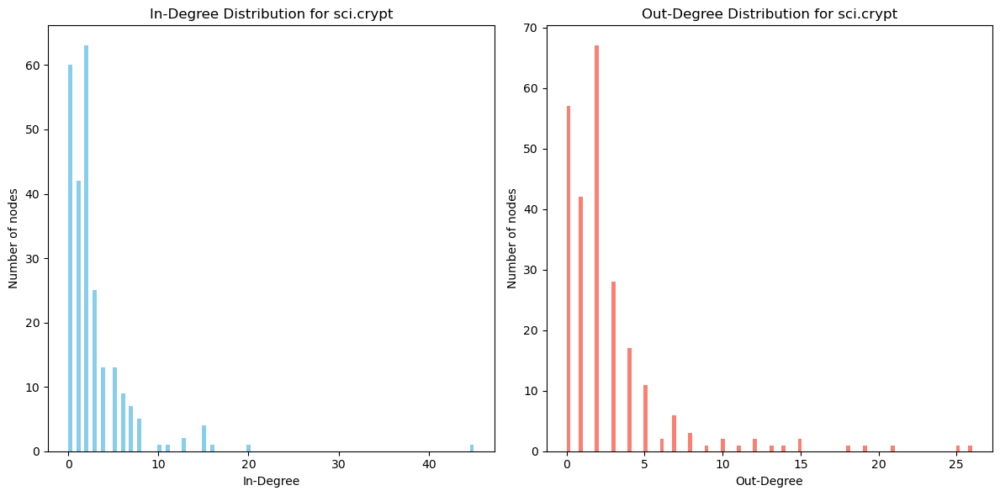

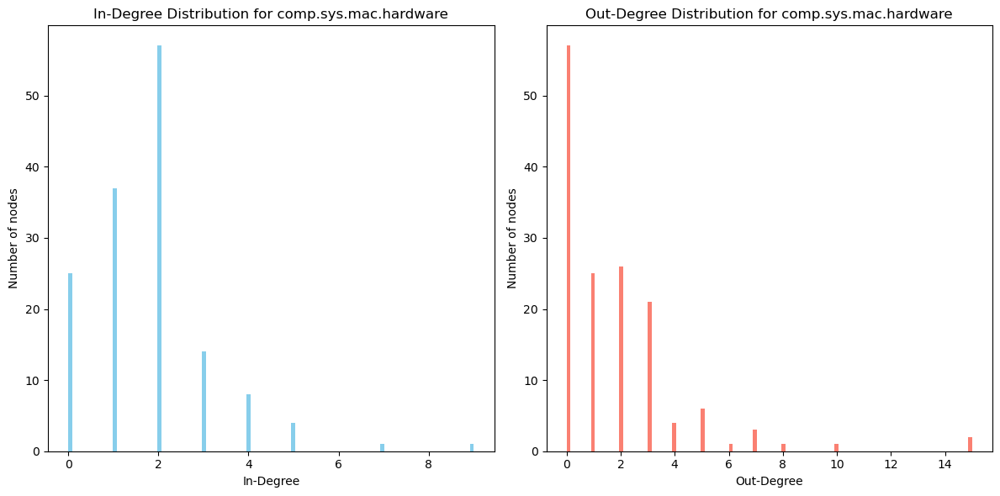

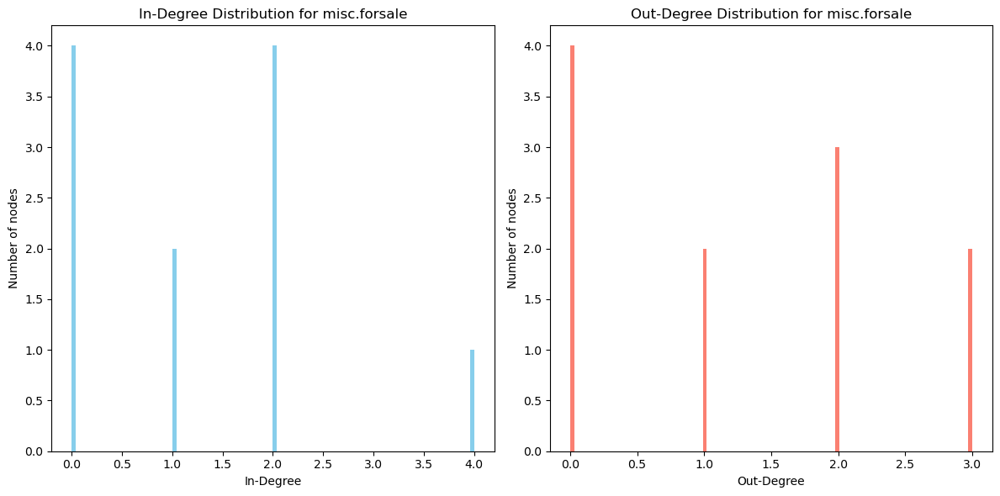

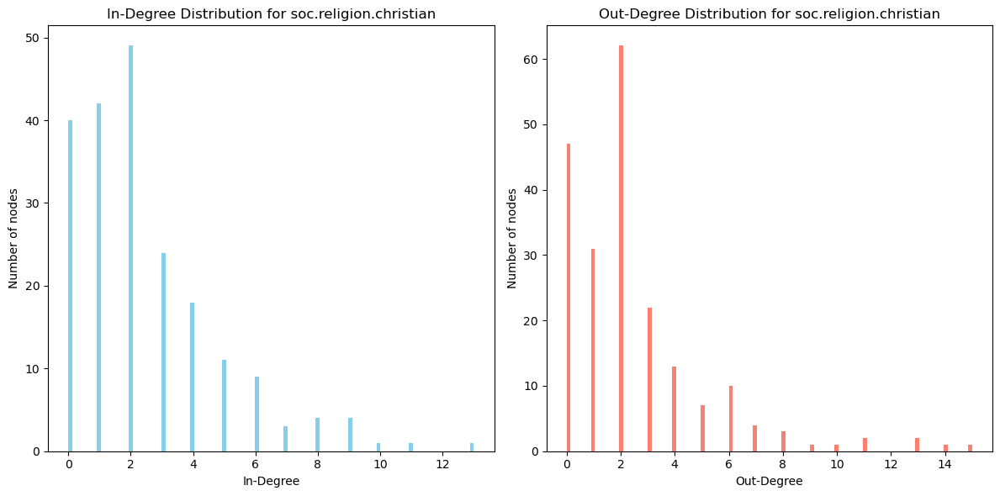

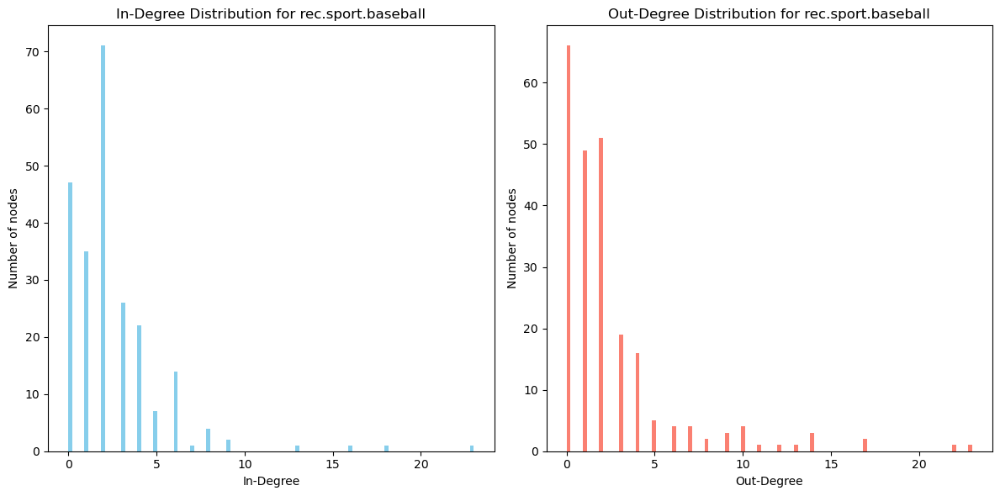

...

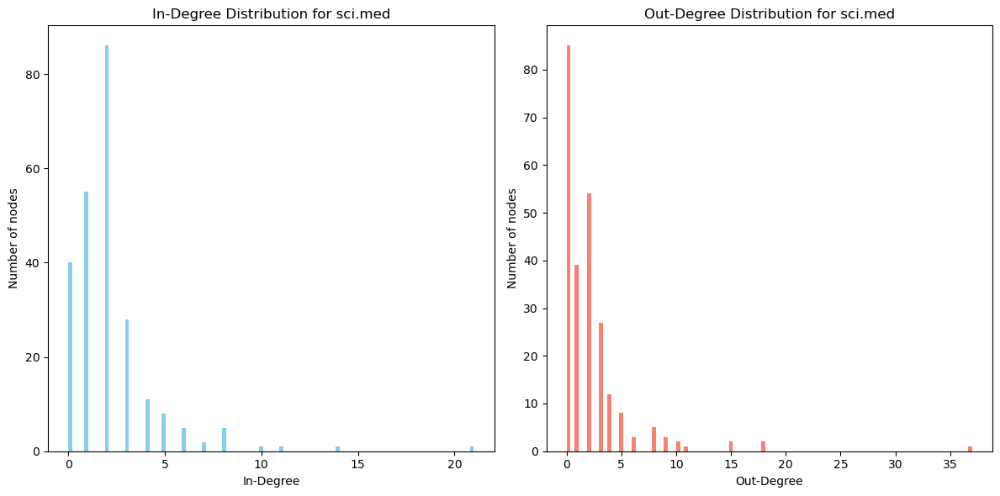

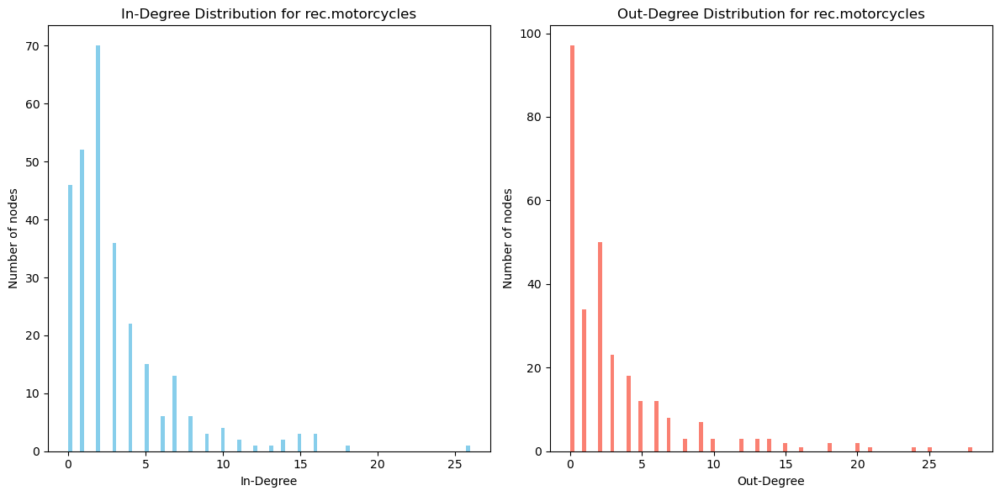

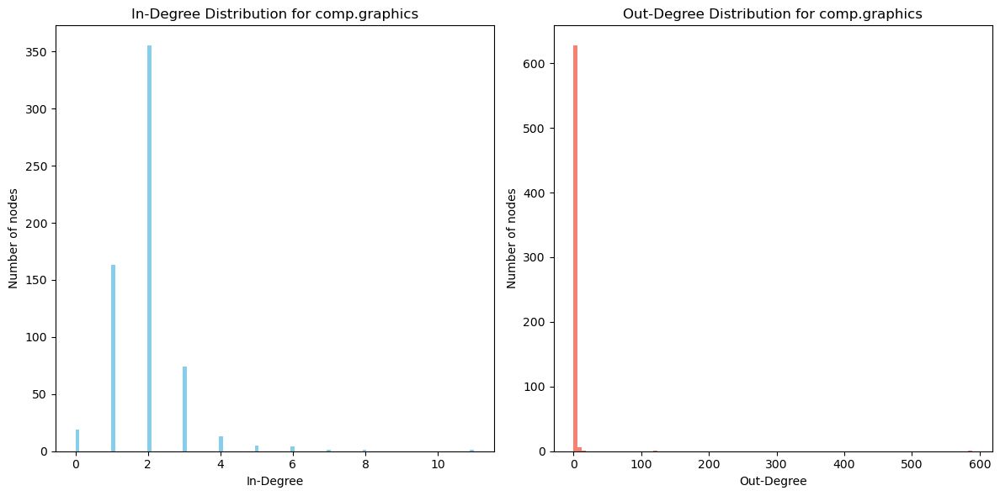

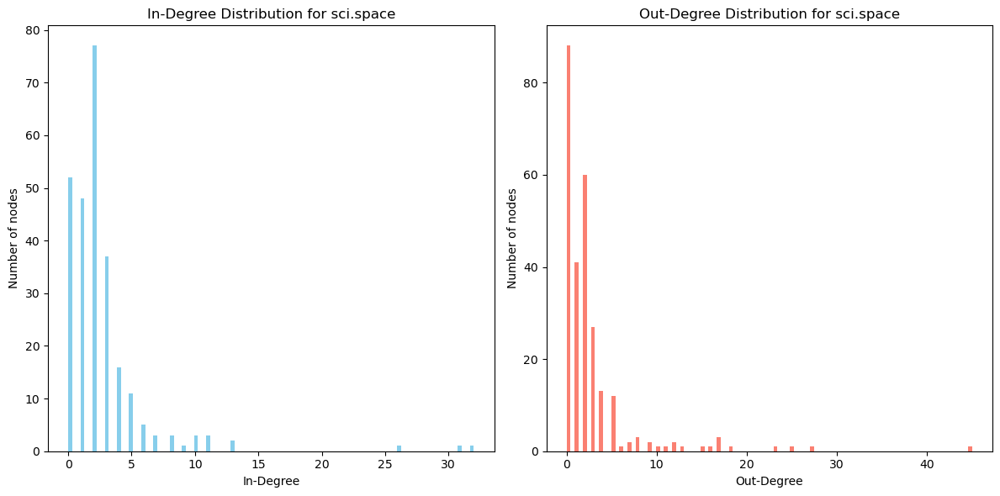

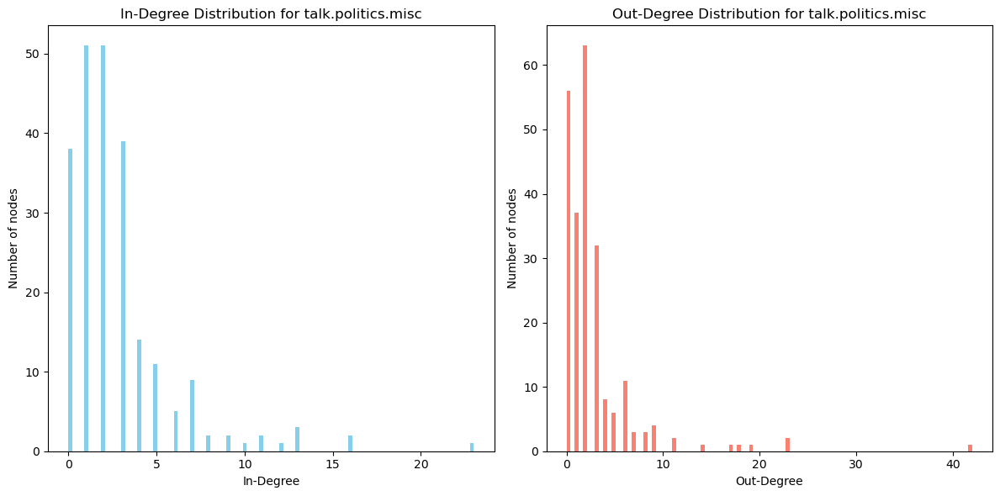

In [160]:
for title, graph in newsgroups_graphs.items():
    in_degrees = [d for n, d in graph.in_degree()]
    out_degrees = [d for n, d in graph.out_degree()]

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.hist(in_degrees, bins=100, color='skyblue')
    plt.title(f'In-Degree Distribution for {title}')
    plt.xlabel('In-Degree')
    plt.ylabel('Number of nodes')

    plt.subplot(1, 2, 2)
    plt.hist(out_degrees, bins=100, color='salmon')
    plt.title(f'Out-Degree Distribution for {title}')
    plt.xlabel('Out-Degree')
    plt.ylabel('Number of nodes')
    plt.tight_layout()
    plt.show()

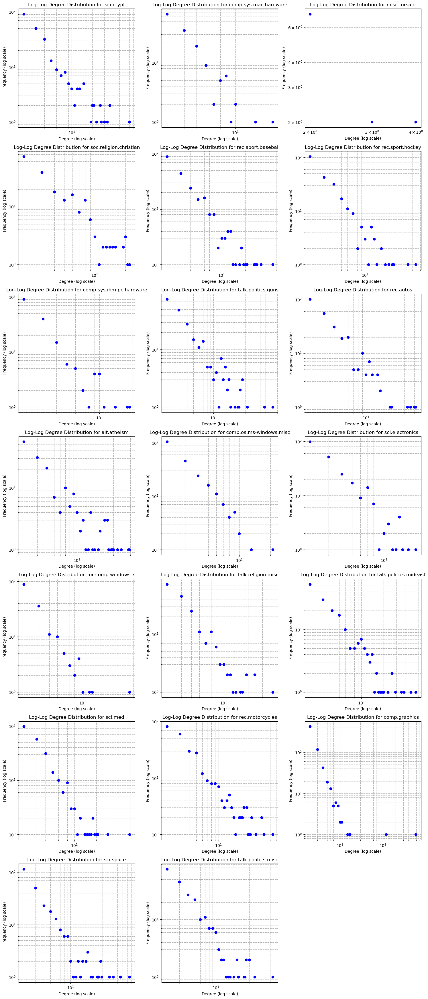

In [161]:
def plot_log_log_degree_distribution(axes, graph, title, index):
    degrees = [deg for node, deg in graph.degree()]
    degree_count = {}
    for degree in degrees:
        if degree not in degree_count:
            degree_count[degree] = 0
        degree_count[degree] += 1
    
    degree_values = sorted(degree_count.items())
    degrees, counts = zip(*degree_values)
    axes[index].loglog(degrees, counts, marker='o', linestyle='None', color='b')
    axes[index].set_xlabel('Degree (log scale)', fontsize=10)
    axes[index].set_ylabel('Frequency (log scale)', fontsize=10)
    axes[index].set_title(f'Log-Log Degree Distribution for {title}', fontsize=12)
    axes[index].grid(True, which="both", ls="--")

num_plots = len(newsgroups_graphs)
num_rows = (num_plots // 3) + (1 if num_plots % 3 != 0 else 0)
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))
axes = axes.flatten()

for i, (title, graph) in enumerate(newsgroups_graphs.items()):
    plot_log_log_degree_distribution(axes, graph, title, i)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [162]:
def analyze_connected_components(graph, title):
    scc = list(nx.strongly_connected_components(graph))
    largest_scc = max(scc, key=len)
    print(f"{title}:")
    print(f"  Total number of nodes: {len(graph.nodes())}")
    print(f"  Largest Strongly Connected Component size: {len(largest_scc)}")

for title, graph in newsgroups_graphs.items():
    analyze_connected_components(graph, title)

sci.crypt:
  Total number of nodes: 248
  Largest Strongly Connected Component size: 98
comp.sys.mac.hardware:
  Total number of nodes: 147
  Largest Strongly Connected Component size: 4
misc.forsale:
  Total number of nodes: 11
  Largest Strongly Connected Component size: 1
soc.religion.christian:
  Total number of nodes: 207
  Largest Strongly Connected Component size: 89
rec.sport.baseball:
  Total number of nodes: 233
  Largest Strongly Connected Component size: 68
rec.sport.hockey:
  Total number of nodes: 244
  Largest Strongly Connected Component size: 66
comp.sys.ibm.pc.hardware:
  Total number of nodes: 172
  Largest Strongly Connected Component size: 9
talk.politics.guns:
  Total number of nodes: 243
  Largest Strongly Connected Component size: 79
rec.autos:
  Total number of nodes: 274
  Largest Strongly Connected Component size: 80
alt.atheism:
  Total number of nodes: 176
  Largest Strongly Connected Component size: 74
comp.os.ms-windows.misc:
  Total number of nodes: 222



Top 5 nodes by degree for sci.crypt:
1. Node: strnlght@netcom.com
   Total Degree: 70
2. Node: pat@rwing.uucp
   Total Degree: 36
3. Node: pmetzger@snark.shearson.com
   Total Degree: 36
4. Node: holland@cs.colostate.edu
   Total Degree: 33
5. Node: smb@research.att.com
   Total Degree: 30

Total number of edges: 691
Average degree of the network: 5.57


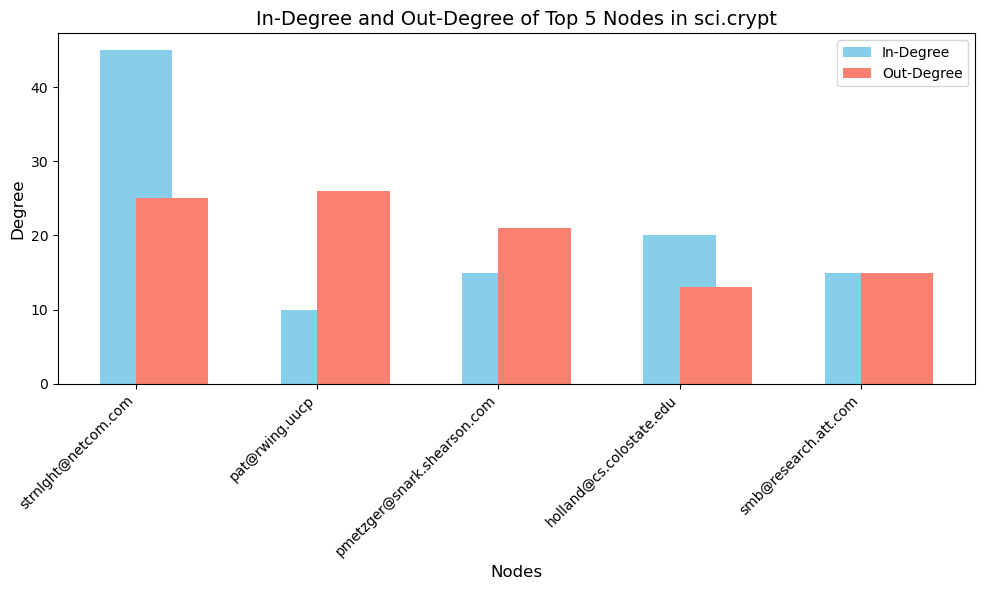


Top 5 nodes by degree for comp.sys.mac.hardware:
1. Node: hades@coos.dartmouth.edu
   Total Degree: 24
2. Node: hk.mlr@forsythe.stanford.edu
   Total Degree: 16
3. Node: ferch@ucs.ubc.ca
   Total Degree: 10
4. Node: carter@cae.wisc.edu
   Total Degree: 10
5. Node: d88-jwa@hemul.nada.kth.se
   Total Degree: 9

Total number of edges: 261
Average degree of the network: 3.55


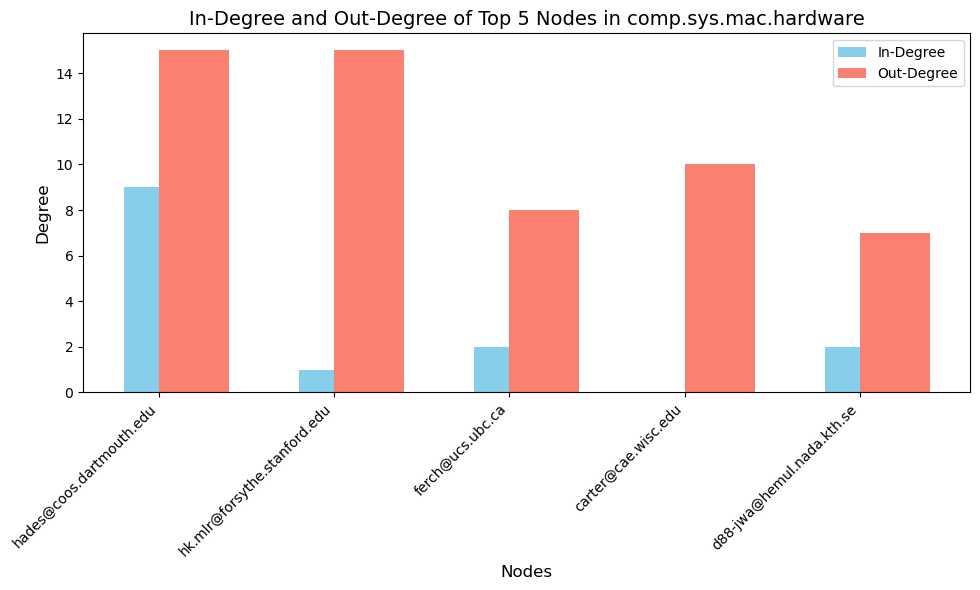


Top 5 nodes by degree for misc.forsale:
1. Node: koutd@hirama.hiram.edu
   Total Degree: 4
2. Node: martimer@jaguar.wpi.edu
   Total Degree: 4
3. Node: lazaro@pyuxf.cc.bellcore.com
   Total Degree: 3
4. Node: martimer@bigwpi.wpi.edu
   Total Degree: 3
5. Node: jnu@bigboote.wpi.edu
   Total Degree: 2

Total number of edges: 14
Average degree of the network: 2.55


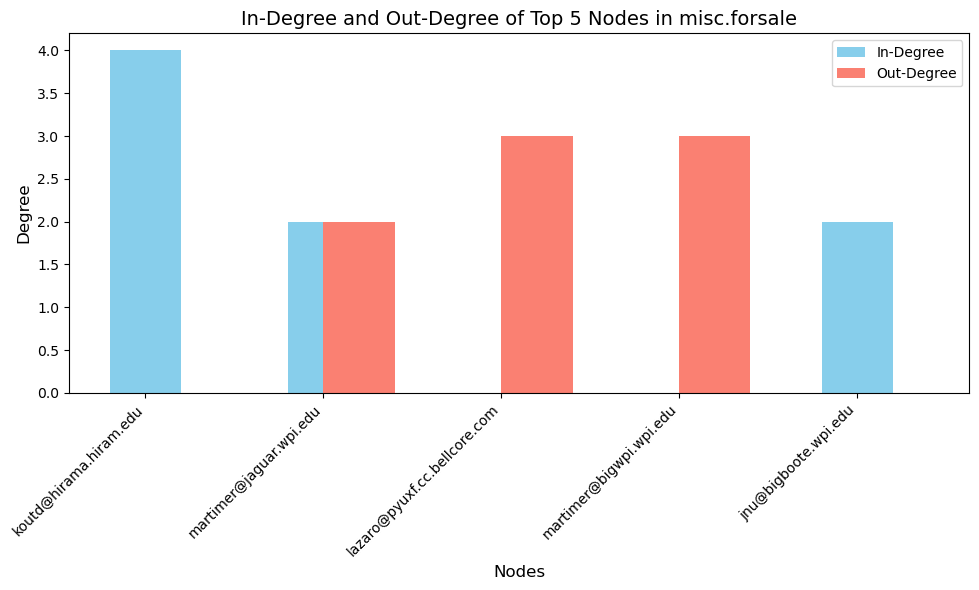


Top 5 nodes by degree for soc.religion.christian:
1. Node: mserv@mozart.cc.iup.edu
   Total Degree: 22
2. Node: gt7122b@prism.gatech.edu
   Total Degree: 21
3. Node: hudson@athena.cs.uga.edu
   Total Degree: 20
4. Node: llo@uu4.psi.com
   Total Degree: 20
5. Node: revdak@netcom.com
   Total Degree: 20

Total number of edges: 516
Average degree of the network: 4.99


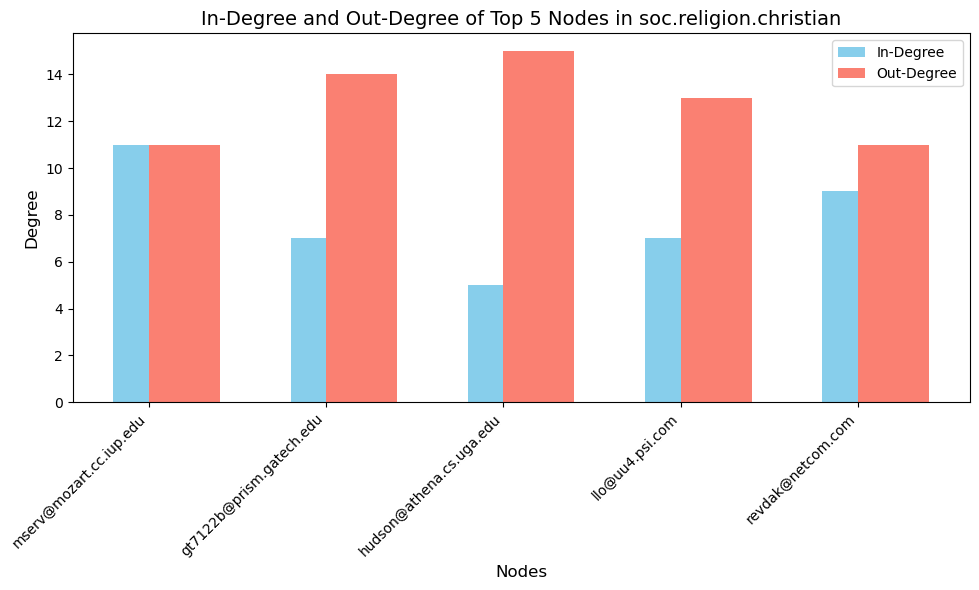


Top 5 nodes by degree for rec.sport.baseball:
1. Node: tedward@cs.cornell.edu
   Total Degree: 45
2. Node: mss@netcom.com
   Total Degree: 32
3. Node: snichols@adobe.com
   Total Degree: 28
4. Node: fierkelab@bchm.biochem.duke.edu
   Total Degree: 27
5. Node: roger@crux.princeton.edu
   Total Degree: 26

Total number of edges: 589
Average degree of the network: 5.06


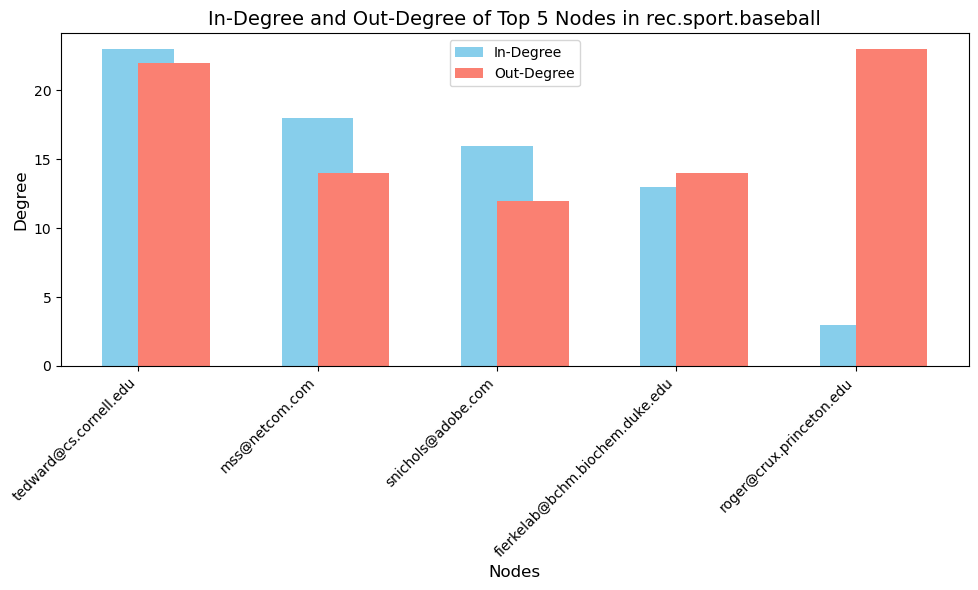


Top 5 nodes by degree for rec.sport.hockey:
1. Node: golchowy@alchemy.chem.utoronto.ca
   Total Degree: 44
2. Node: maynard@ramsey.cs.laurentian.ca
   Total Degree: 35
3. Node: dchhabra@stpl.ists.ca
   Total Degree: 23
4. Node: hammerl@acsu.buffalo.edu
   Total Degree: 22
5. Node: gballent@hudson.uvic.ca
   Total Degree: 20

Total number of edges: 544
Average degree of the network: 4.46


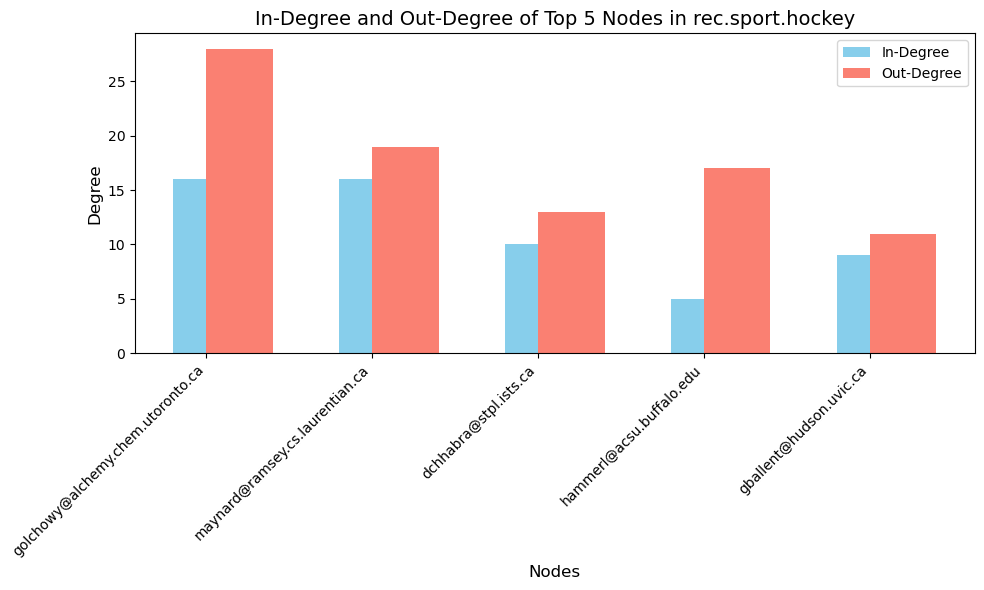


Top 5 nodes by degree for comp.sys.ibm.pc.hardware:
1. Node: guyd@austin.ibm.com
   Total Degree: 19
2. Node: wlsmith@valve.heart.rri.uwo.ca
   Total Degree: 18
3. Node: bgrubb@dante.nmsu.edu
   Total Degree: 14
4. Node: glang@slee01.srl.ford.com
   Total Degree: 11
5. Node: ab245@cleveland.freenet.edu
   Total Degree: 10

Total number of edges: 291
Average degree of the network: 3.38


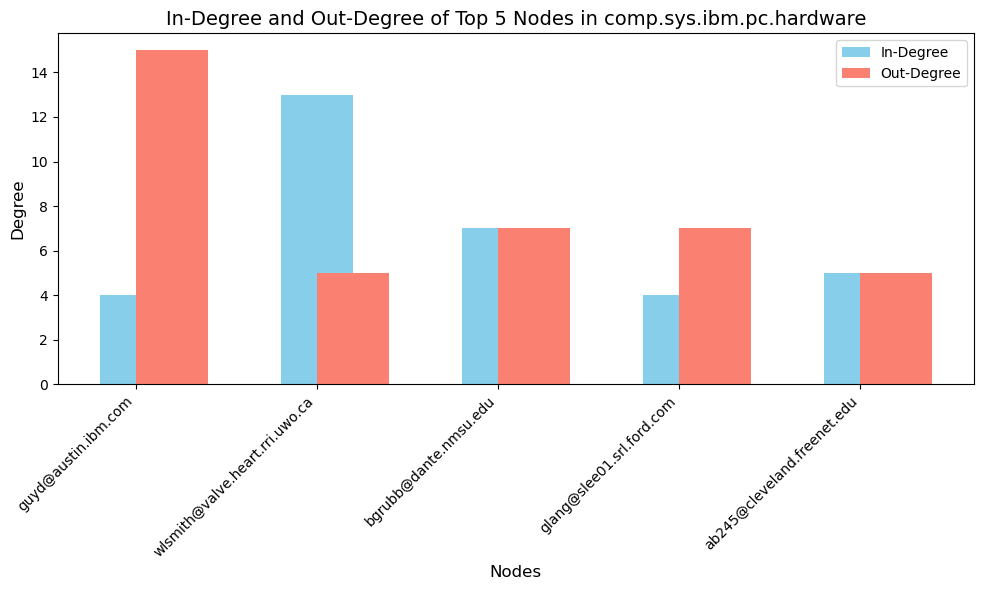


Top 5 nodes by degree for talk.politics.guns:
1. Node: cdt@sw.stratus.com
   Total Degree: 77
2. Node: jmd@cube.handheld.com
   Total Degree: 58
3. Node: irvine@uxh.cso.uiuc.edu
   Total Degree: 32
4. Node: andy@sail.stanford.edu
   Total Degree: 27
5. Node: jrm@gnv.ifas.ufl.edu
   Total Degree: 27

Total number of edges: 748
Average degree of the network: 6.16


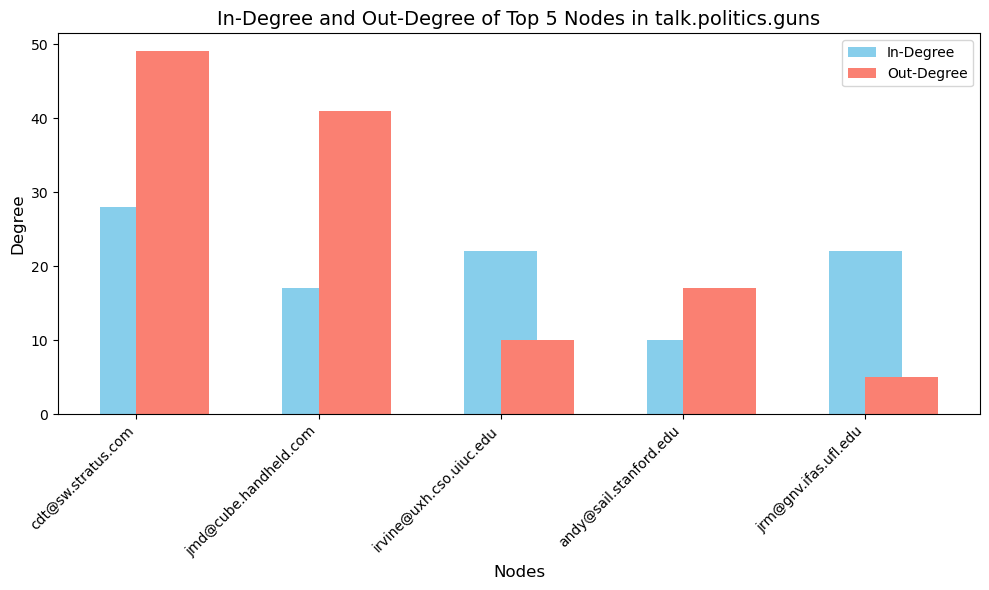


Top 5 nodes by degree for rec.autos:
1. Node: cka52397@uxa.cso.uiuc.edu
   Total Degree: 42
2. Node: aas7@po.cwru.edu
   Total Degree: 40
3. Node: boyle@cactus.org
   Total Degree: 36
4. Node: callison@uokmax.ecn.uoknor.edu
   Total Degree: 33
5. Node: wrat@unisql.uucp
   Total Degree: 21

Total number of edges: 658
Average degree of the network: 4.80


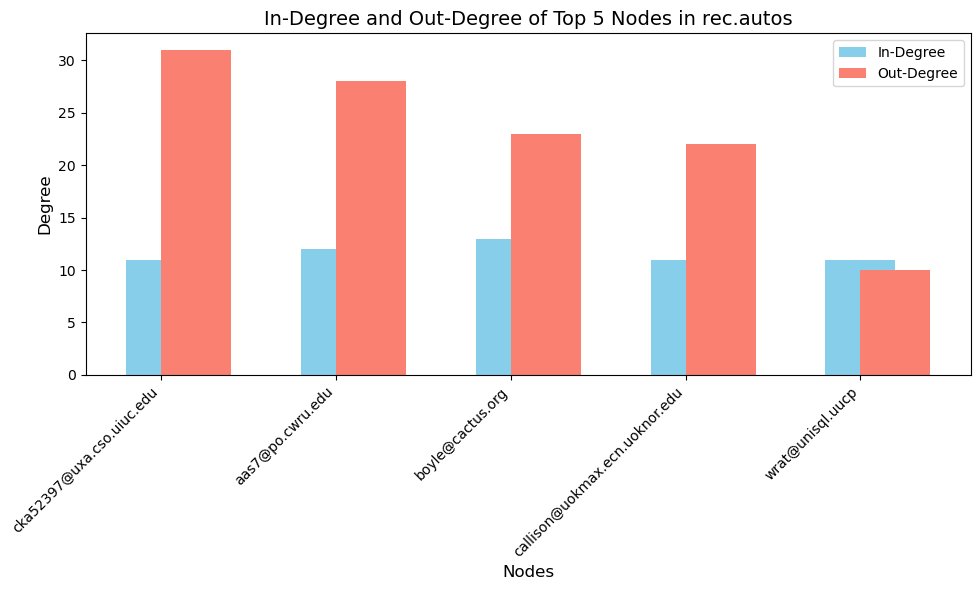


Top 5 nodes by degree for alt.atheism:
1. Node: livesey@solntze.wpd.sgi.com
   Total Degree: 49
2. Node: kmr4@po.cwru.edu
   Total Degree: 47
3. Node: bil@okcforum.osrhe.edu
   Total Degree: 38
4. Node: bobbe@vice.ico.tek.com
   Total Degree: 34
5. Node: i3150101@dbstu1.rz.tu-bs.de
   Total Degree: 30

Total number of edges: 616
Average degree of the network: 7.00


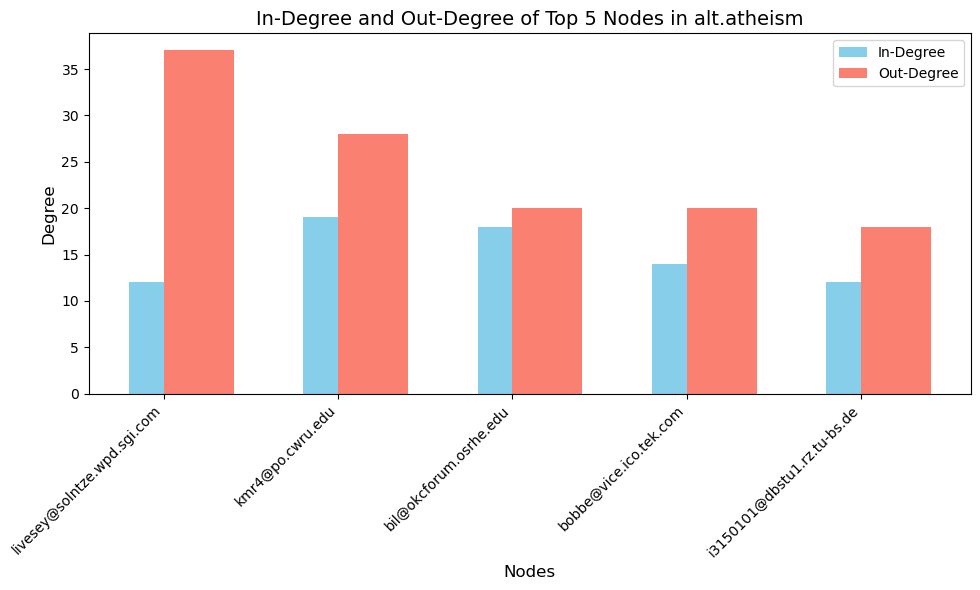


Top 5 nodes by degree for comp.os.ms-windows.misc:
1. Node: louray@seas.gwu.edu
   Total Degree: 21
2. Node: rmohns@vax.clarku.edu
   Total Degree: 13
3. Node: kdb@sunbar.mc.duke.edu
   Total Degree: 10
4. Node: bferrell@ant.occ.uc.edu
   Total Degree: 10
5. Node: ccastco@prism.gatech.edu
   Total Degree: 9

Total number of edges: 385
Average degree of the network: 3.47


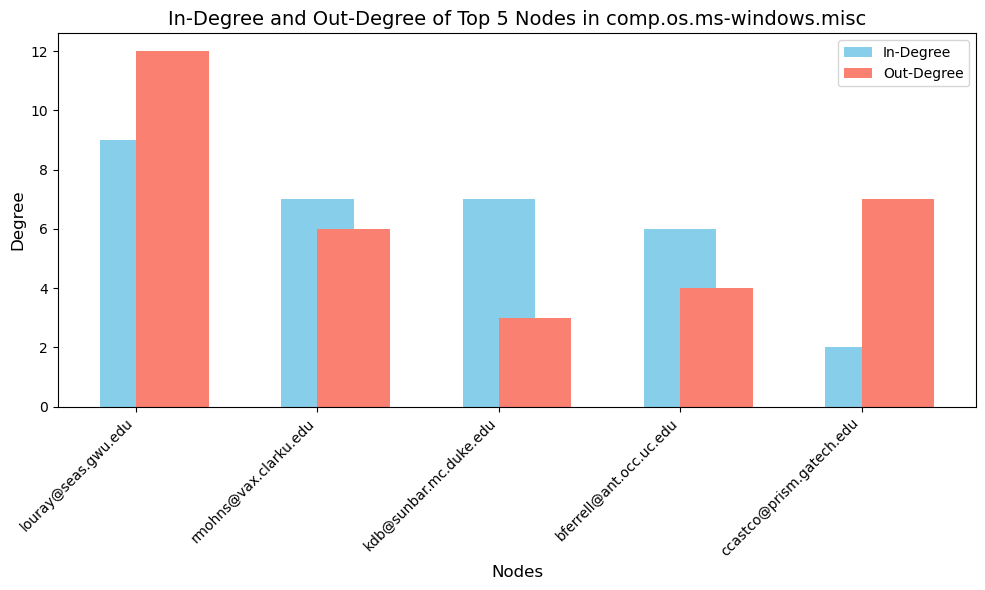


Top 5 nodes by degree for sci.electronics:
1. Node: kludge@grissom.larc.nasa.gov
   Total Degree: 20
2. Node: mcovingt@aisun3.ai.uga.edu
   Total Degree: 17
3. Node: vanderby@mprgate.mpr.ca
   Total Degree: 15
4. Node: jeh@cmkrnl.com
   Total Degree: 14
5. Node: msunde01@mik.uky.edu
   Total Degree: 14

Total number of edges: 471
Average degree of the network: 3.96


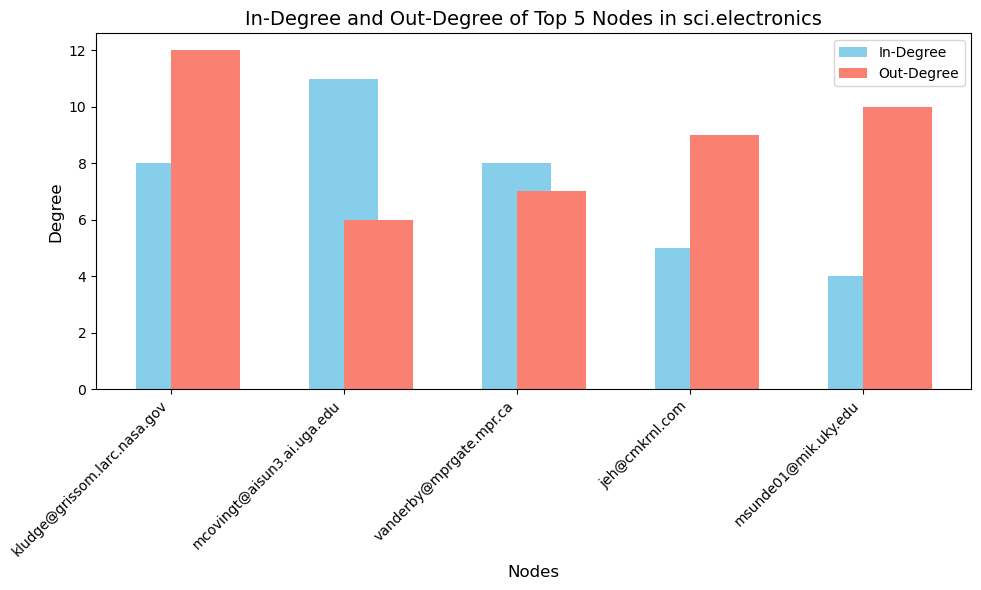


Top 5 nodes by degree for comp.windows.x:
1. Node: dbl@visual.com
   Total Degree: 36
2. Node: beck@irzr17.inf.tu-dresden.de
   Total Degree: 13
3. Node: mark@taylor.uucp
   Total Degree: 12
4. Node: brown@ftms.uucp
   Total Degree: 10
5. Node: art@cs.ualberta.ca
   Total Degree: 9

Total number of edges: 277
Average degree of the network: 3.38


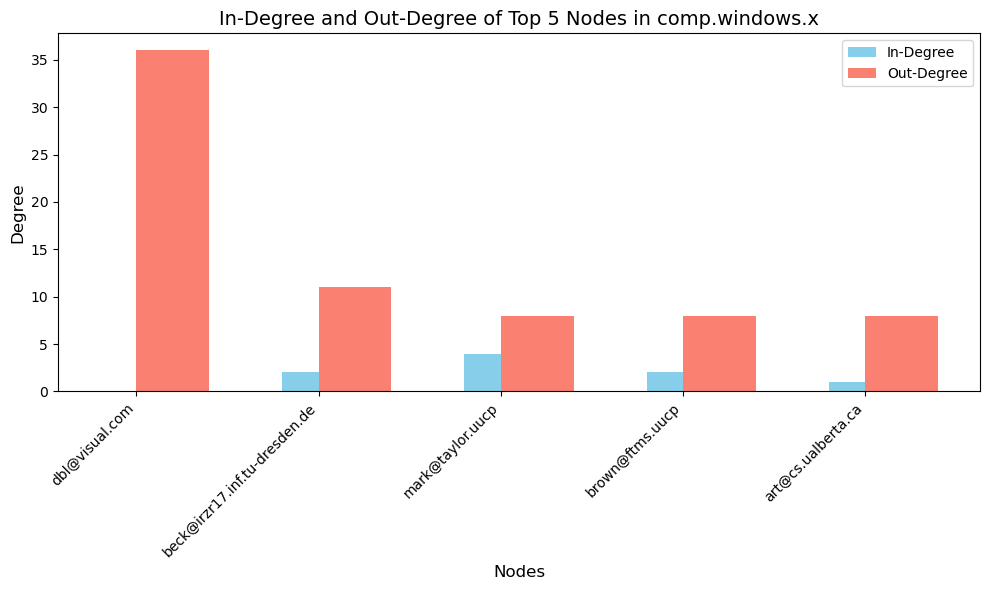


Top 5 nodes by degree for talk.religion.misc:
1. Node: sandvik@newton.apple.com
   Total Degree: 40
2. Node: pharvey@quack.kfu.com
   Total Degree: 24
3. Node: mlee@post.royalroads.ca
   Total Degree: 24
4. Node: ch981@cleveland.freenet.edu
   Total Degree: 19
5. Node: b645zaw@utarlg.uta.edu
   Total Degree: 19

Total number of edges: 446
Average degree of the network: 4.53


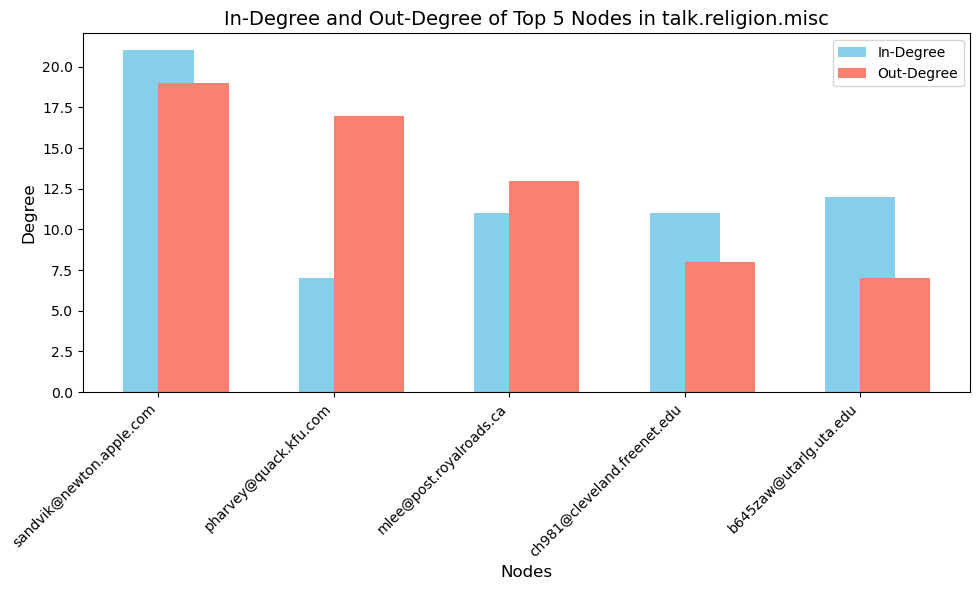


Top 5 nodes by degree for talk.politics.mideast:
1. Node: tclock@orion.oac.uci.edu
   Total Degree: 55
2. Node: jake@bony1.bony.com
   Total Degree: 47
3. Node: adam@endor.uucp
   Total Degree: 38
4. Node: ab4z@virginia.edu
   Total Degree: 35
5. Node: sera@zuma.uucp
   Total Degree: 29

Total number of edges: 609
Average degree of the network: 6.62


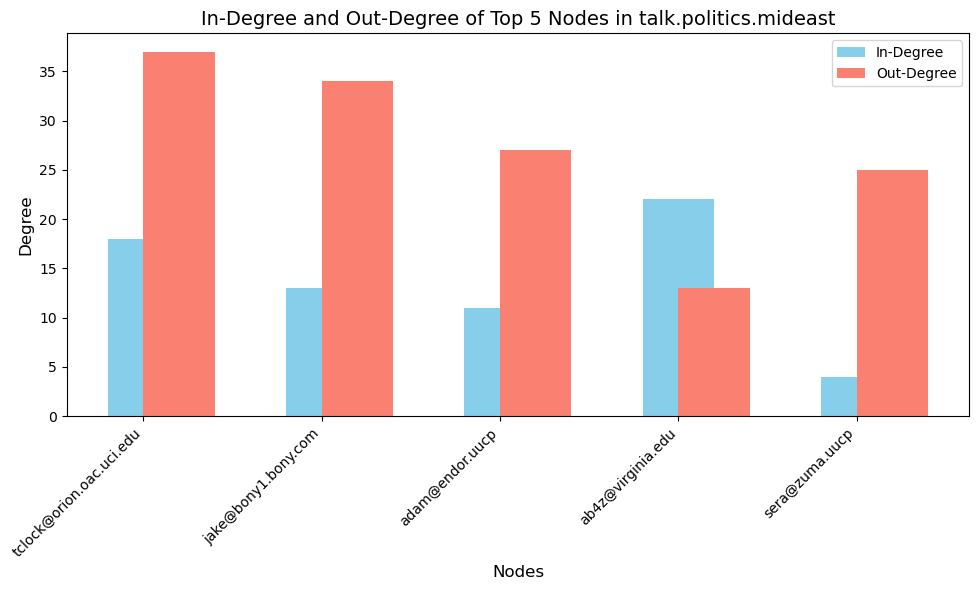


Top 5 nodes by degree for sci.med:
1. Node: geb@cs.pitt.edu
   Total Degree: 58
2. Node: dyer@spdcc.com
   Total Degree: 29
3. Node: noring@netcom.com
   Total Degree: 21
4. Node: kxgst1+@pitt.edu
   Total Degree: 20
5. Node: swkirch@sun6850.nrl.navy.mil
   Total Degree: 19

Total number of edges: 535
Average degree of the network: 4.39


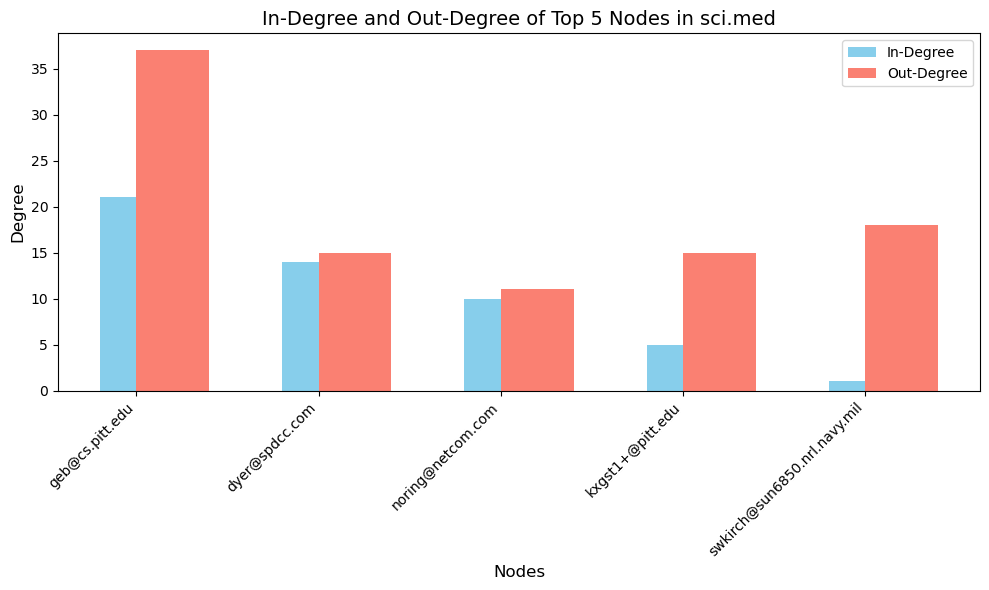


Top 5 nodes by degree for rec.motorcycles:
1. Node: egreen@east.sun.com
   Total Degree: 54
2. Node: behanna@syl.nj.nec.com
   Total Degree: 41
3. Node: jlevine@rd.hydro.on.ca
   Total Degree: 38
4. Node: speedy@engr.latech.edu
   Total Degree: 38
5. Node: infante@acpub.duke.edu
   Total Degree: 32

Total number of edges: 917
Average degree of the network: 6.39


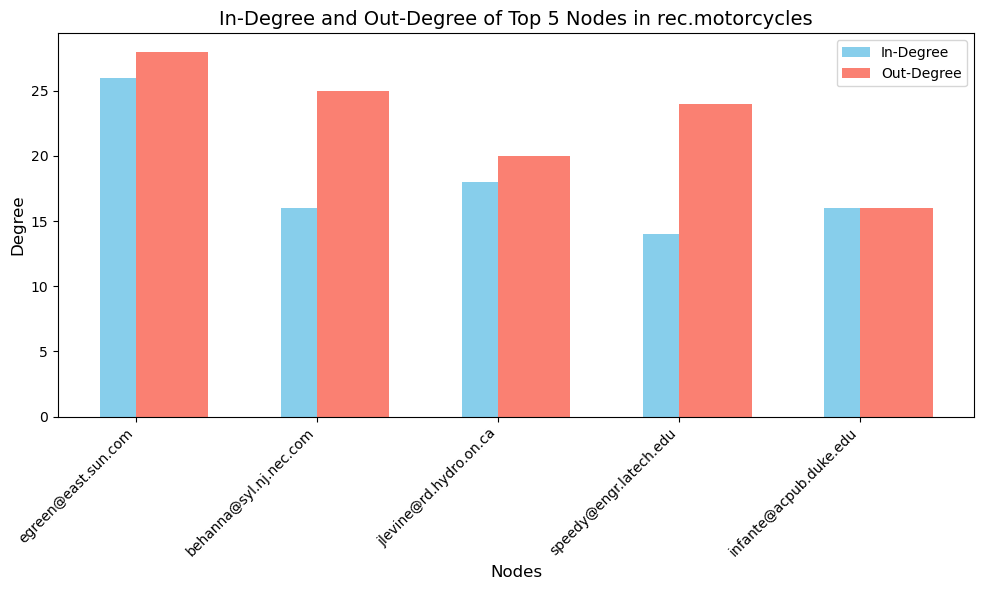


Top 5 nodes by degree for comp.graphics:
1. Node: weston@ucssun1.sdsu.edu
   Total Degree: 589
2. Node: nfotis@ntua.gr
   Total Degree: 119
3. Node: grieggs@jpl-devvax.jpl.nasa.gov
   Total Degree: 17
4. Node: ab@nova.cc.purdue.edu
   Total Degree: 15
5. Node: zyeh@caspian.usc.edu
   Total Degree: 11

Total number of edges: 1222
Average degree of the network: 3.84


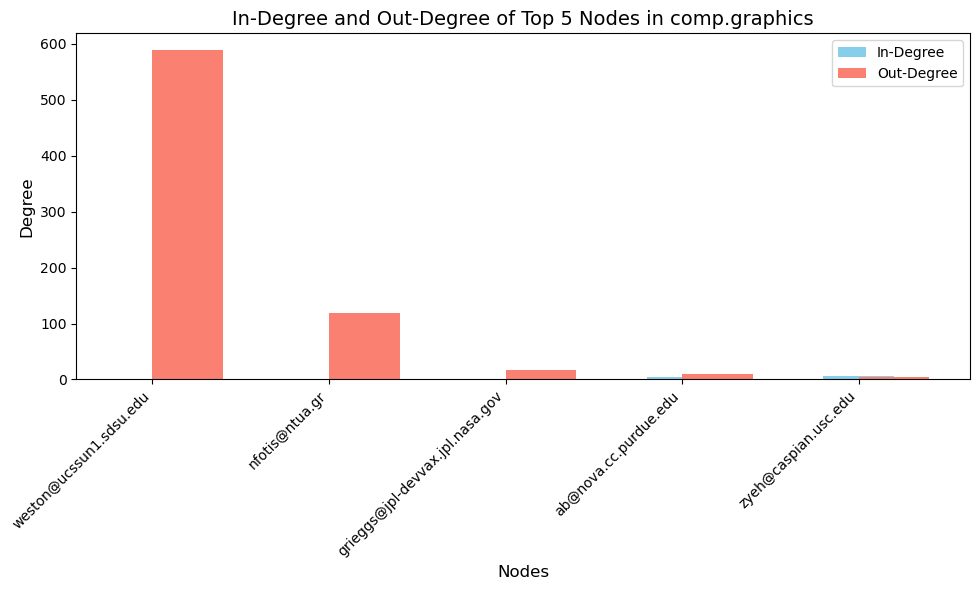


Top 5 nodes by degree for sci.space:
1. Node: henry@zoo.toronto.edu
   Total Degree: 76
2. Node: prb@access.digex.com
   Total Degree: 55
3. Node: nsmca@aurora.alaska.edu
   Total Degree: 43
4. Node: mccall@mksol.dseg.ti.com
   Total Degree: 38
5. Node: pgf@srl03.cacs.usl.edu
   Total Degree: 29

Total number of edges: 694
Average degree of the network: 5.26


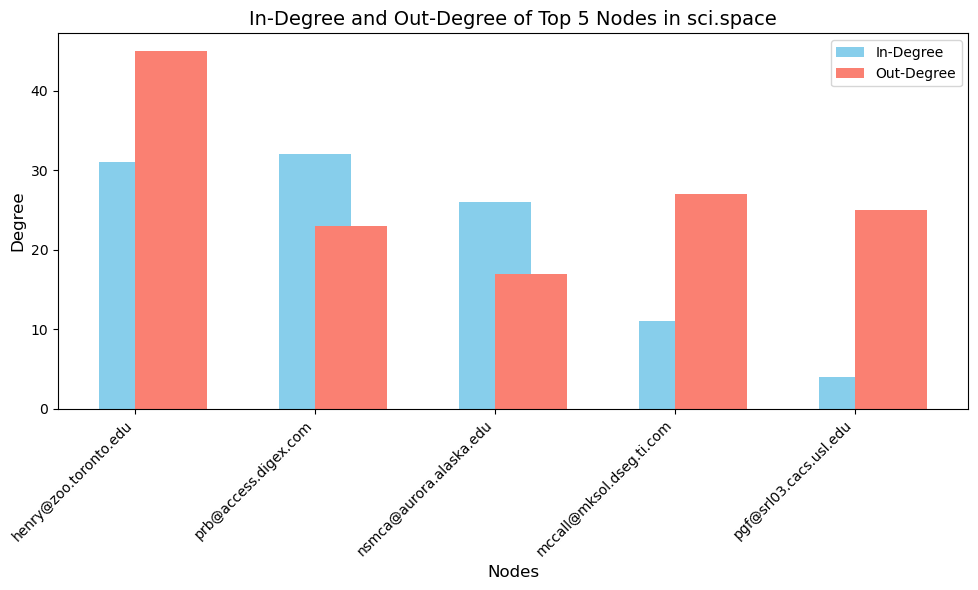


Top 5 nodes by degree for talk.politics.misc:
1. Node: cramer@optilink.com
   Total Degree: 65
2. Node: hallam@dscomsa.desy.de
   Total Degree: 36
3. Node: mwilson@ncratl.atlantaga.ncr.com
   Total Degree: 30
4. Node: steveh@thor.isc-br.com
   Total Degree: 30
5. Node: an030@cleveland.freenet.edu
   Total Degree: 27

Total number of edges: 646
Average degree of the network: 5.57


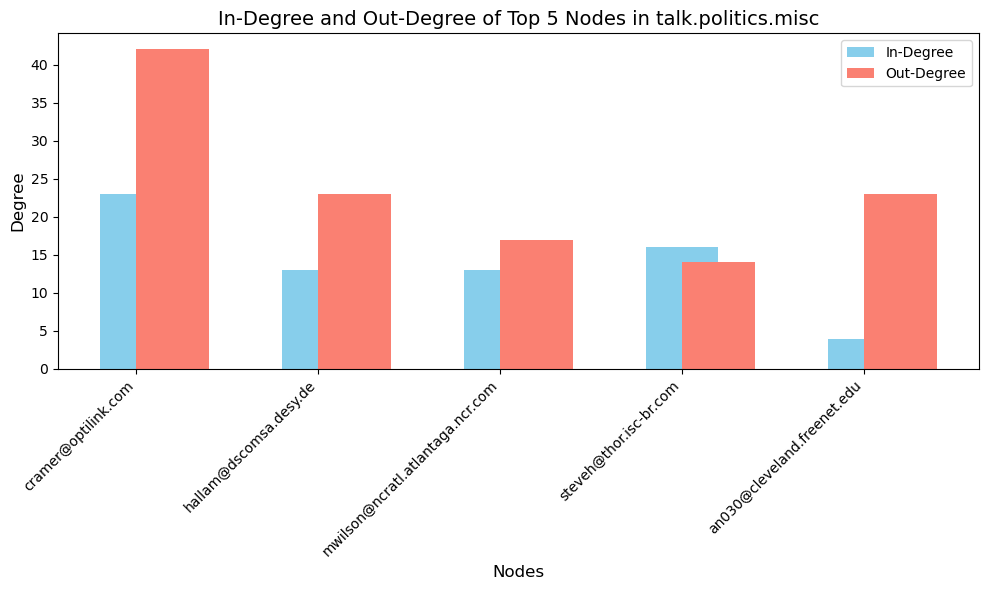

In [163]:
for title, graph in newsgroups_graphs.items():
    print(f"\nTop 5 nodes by degree for {title}:")
    total_edges = len(graph.edges())
    total_nodes = len(graph.nodes())
    average_degree = sum(dict(graph.degree()).values()) / total_nodes if total_nodes > 0 else 0
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    node_degrees = [(node, in_degrees[node] + out_degrees[node]) for node in graph.nodes()]
    sorted_node_degrees = sorted(node_degrees, key=lambda x: x[1], reverse=True)

    top_nodes = sorted_node_degrees[:5]
    
    for i, (node, degree) in enumerate(top_nodes):
        in_degree = in_degrees[node]
        out_degree = out_degrees[node]
        
        print(f"{i+1}. Node: {node}")
        print(f"   Total Degree: {degree}")
    
    print(f"\nTotal number of edges: {total_edges}")
    print(f"Average degree of the network: {average_degree:.2f}")

    node_labels = [node for node, _ in top_nodes]
    in_deg_values = [in_degrees[node] for node, _ in top_nodes]
    out_deg_values = [out_degrees[node] for node, _ in top_nodes]
    x = range(len(top_nodes))
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(x, in_deg_values, width=0.4, label='In-Degree', color='skyblue', align='center')
    ax.bar(x, out_deg_values, width=0.4, label='Out-Degree', color='salmon', align='edge')
    ax.set_xlabel('Nodes', fontsize=12)
    ax.set_ylabel('Degree', fontsize=12)
    ax.set_title(f"In-Degree and Out-Degree of Top 5 Nodes in {title}", fontsize=14)
    ax.set_xticks(x)
    ax.set_xticklabels(node_labels, rotation=45, ha='right', fontsize=10)
    ax.legend()
    plt.tight_layout()
    plt.show()

Common nodes between these networks.

In [164]:
network_nodes = {title: set(graph.nodes()) for title, graph in newsgroups_graphs.items()}

overlap_counts = {}

for net1, nodes1 in network_nodes.items():
    for net2, nodes2 in network_nodes.items():
        if net1 != net2:
            pair = tuple(sorted((net1, net2)))
            if pair not in overlap_counts:
                common_nodes = nodes1 & nodes2
                overlap_counts[pair] = len(common_nodes)

total_common_nodes = sum(overlap_counts.values())
print(f"Total number of common nodes across all pairs: {total_common_nodes}\n")
sorted_overlaps = sorted(overlap_counts.items(), key=lambda x: x[1], reverse=True)

for (net1, net2), count in sorted_overlaps:
    print(f"Number of common nodes between {net1} and {net2}: {count}")

Total number of common nodes across all pairs: 347

Number of common nodes between alt.atheism and talk.religion.misc: 32
Number of common nodes between talk.politics.guns and talk.politics.misc: 27
Number of common nodes between rec.autos and rec.motorcycles: 15
Number of common nodes between talk.politics.misc and talk.religion.misc: 14
Number of common nodes between soc.religion.christian and talk.religion.misc: 10
Number of common nodes between comp.os.ms-windows.misc and comp.sys.ibm.pc.hardware: 10
Number of common nodes between sci.crypt and talk.politics.guns: 9
Number of common nodes between rec.sport.baseball and rec.sport.hockey: 8
Number of common nodes between rec.sport.baseball and talk.politics.misc: 8
Number of common nodes between alt.atheism and soc.religion.christian: 7
Number of common nodes between sci.med and soc.religion.christian: 7
Number of common nodes between talk.politics.guns and talk.religion.misc: 7
Number of common nodes between comp.graphics and comp.w

# Combined network and communities analysis 

Combined Network characteristics.

In [165]:
combined_graph = nx.DiGraph()

for title, graph in newsgroups_graphs.items():
    for node in graph.nodes():
        combined_graph.add_node(node)
    for source, target in graph.edges():
        combined_graph.add_edge(source, target)

G_undir = combined_graph.to_undirected()

num_nodes = G_undir.number_of_nodes()
num_edges = G_undir.number_of_edges()
avg_degree = sum(dict(G_undir.degree()).values()) / num_nodes

density = nx.density(G_undir)

clustering_coefficients = nx.clustering(G_undir)
avg_clustering_coefficient = sum(clustering_coefficients.values()) / num_nodes

print(f"Network Characteristics:")
print(f"  Number of Nodes: {num_nodes}")
print(f"  Number of Edges: {num_edges}")
print(f"  Average Degree: {avg_degree:.2f}")
print(f"  Density: {density:.4f}")
print(f"  Average Clustering Coefficient: {avg_clustering_coefficient:.4f}")

Network Characteristics:
  Number of Nodes: 4306
  Number of Edges: 10335
  Average Degree: 4.80
  Density: 0.0011
  Average Clustering Coefficient: 0.4731


Community creation and user distribution in each community.

Total number of communities: 21


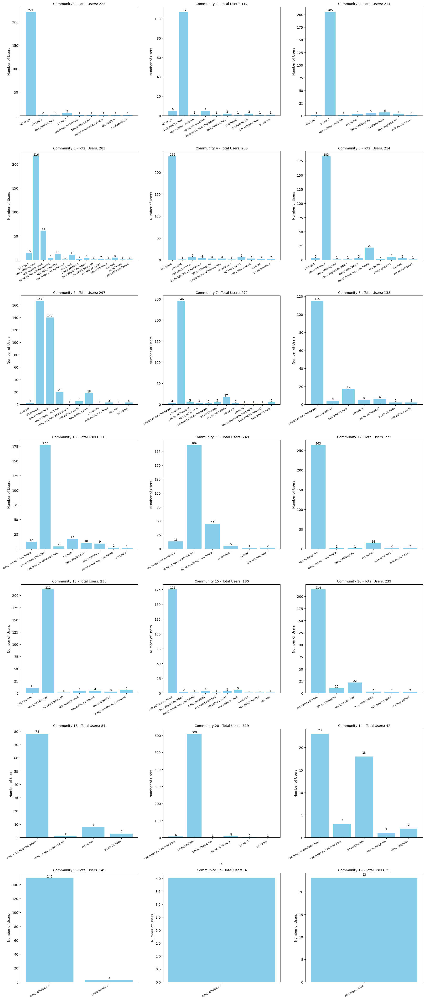

In [166]:
#random.seed(10)
largest_component = max(nx.connected_components(G_undir), key=len)
G_largest = G_undir.subgraph(largest_component).copy()
partition = best_partition(G_largest, random_state=15)

community_users = defaultdict(list)

for node, community_id in partition.items():
    community_users[community_id].append(node)

num_communities = len(community_users)
print(f"Total number of communities: {num_communities}")

user_newsgroup_map = defaultdict(set)

for newsgroup, graph in newsgroups_graphs.items():
    for node in graph.nodes():
        user_newsgroup_map[node].add(newsgroup)
rows = (num_communities // 3) + (num_communities % 3 > 0)

fig, axes = plt.subplots(nrows=rows, ncols=3, figsize=(18, 6 * rows))
axes = axes.flatten()

for i, (community_id, users) in enumerate(community_users.items()):
    newsgroup_distribution = defaultdict(int)

    for user in users:
        if user in user_newsgroup_map:
            for newsgroup in user_newsgroup_map[user]:
                newsgroup_distribution[newsgroup] += 1

    ax = axes[i]
    bars = ax.bar(newsgroup_distribution.keys(), newsgroup_distribution.values(), color='skyblue')
    ax.set_title(f"Community {community_id} - Total Users: {len(users)}", fontsize=10)
    ax.set_ylabel('Number of Users')
    ax.set_xticks(range(len(newsgroup_distribution)))
    ax.set_xticklabels(newsgroup_distribution.keys(), rotation=30, fontsize=8, ha='right')

    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f'{height}', ha='center', va='bottom', fontsize=9)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

And here we have the users that posted in more than one topic for each community.

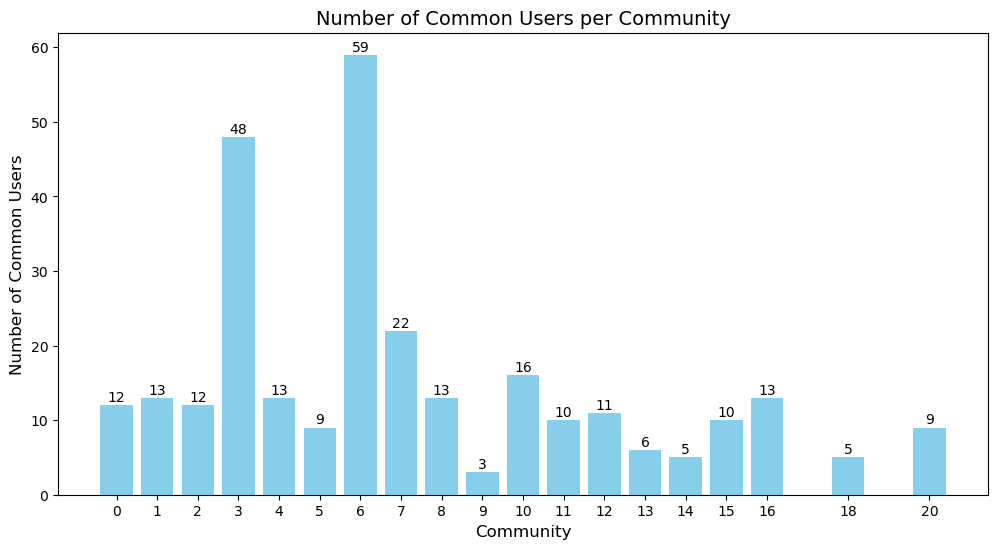

In [167]:
common_nodes = set()
all_nodes = set()

for graph in newsgroups_graphs.values():
    nodes = set(graph.nodes)
    common_nodes.update(nodes & all_nodes)
    all_nodes.update(nodes)

community_common_node_counts = {}

for node, community_id in partition.items():
    if node in common_nodes:
        if community_id not in community_common_node_counts:
            community_common_node_counts[community_id] = 0
        community_common_node_counts[community_id] += 1

# Plotting
plt.figure(figsize=(12, 6))
bars = plt.bar(
    community_common_node_counts.keys(),
    community_common_node_counts.values(),
    color="skyblue",
)

for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 0.1,
        int(yval),
        ha='center',
        va='bottom',
        fontsize=10,
    )

plt.xlabel("Community", fontsize=12)
plt.ylabel("Number of Common Users", fontsize=12)
plt.title("Number of Common Users per Community", fontsize=14)
plt.xticks(list(community_common_node_counts.keys()))
plt.show()

100%|██████████| 3000/3000 [02:39<00:00, 18.83it/s]


BarnesHut Approximation  took  107.85  seconds
Repulsion forces  took  47.16  seconds
Gravitational forces  took  0.36  seconds
Attraction forces  took  0.30  seconds
AdjustSpeedAndApplyForces step  took  1.83  seconds


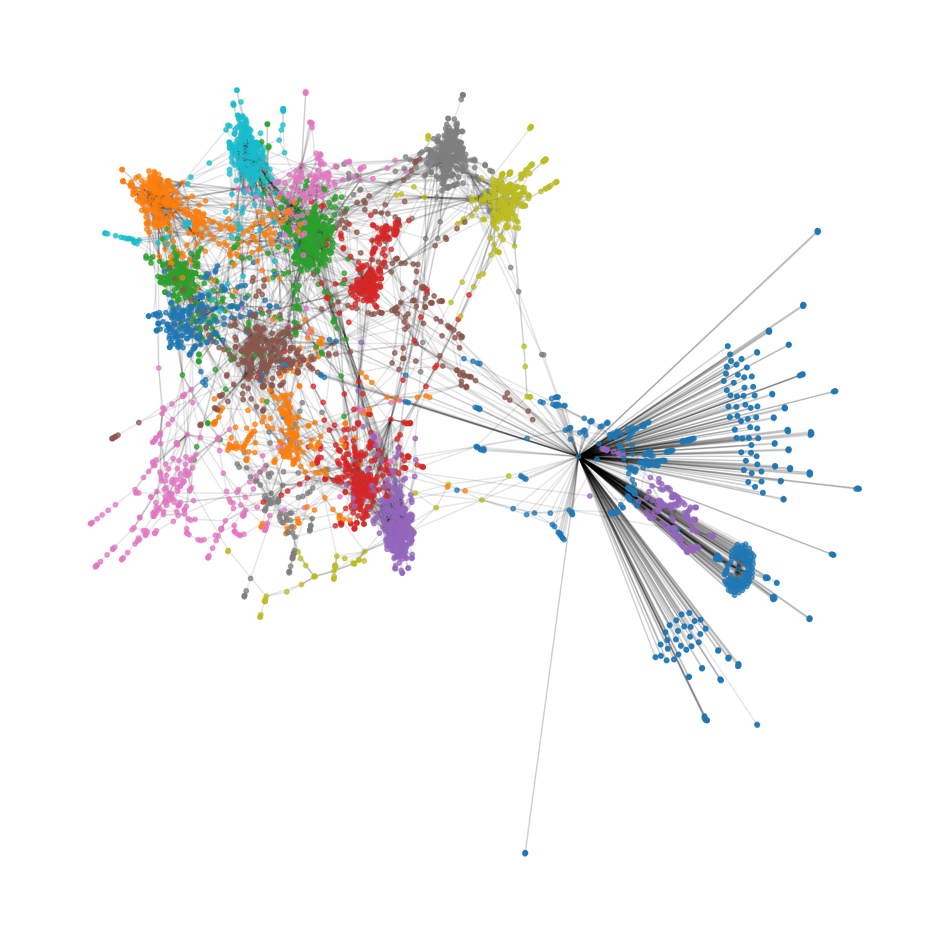

In [168]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=True,  # Dissuade hubs
    linLogMode=False,  # NOT IMPLEMENTED
    adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
    edgeWeightInfluence=1.0,

    # Performance
    jitterTolerance=1.0,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,  # NOT IMPLEMENTED

    # Tuning
    scalingRatio=2.0,
    strongGravityMode=False,
    gravity=1.0,

    # Log
    verbose=True
)

positions = forceatlas2.forceatlas2_networkx_layout(G_undir, pos=None, iterations=3000)

community_sizes = {}

for node, com in partition.items():
    if com not in community_sizes:
        community_sizes[com] = 0
    community_sizes[com] += 1

top_communities = sorted(community_sizes, key=community_sizes.get, reverse=True)
colors = list(mcolors.TABLEAU_COLORS.keys())
community_color_map = {com: colors[i % len(colors)] for i, com in enumerate(top_communities)}
neutral_color = "lightgray"
node_colors = [
    community_color_map.get(partition[node], neutral_color) for node in G_undir.nodes()
]

plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_undir, positions, node_color=node_colors, node_size=10, alpha=0.7)
nx.draw_networkx_edges(G_undir, positions, edge_color="black", alpha=0.1)
plt.axis("off")
plt.show()

High score indicates very strong community structure. Most nodes inside communities are connected, but not with nodes of other communities.

In [169]:
modularity_score = community.modularity(partition, G_undir)

modularity_score

0.8450545665535945

# Text analysis of each community

Text preprocessing first. Same as the one of Assignment 2, but for different stopwords.

In [170]:
stop_words = set(stopwords.words('english')) | {'article', 'would', 'could', 'like', 'writes', 'kkruse', 'lew', 'cdt', 'ru'}
stop_words2 = set(stopwords.words('english')) # use this to create the text for sentiment analysis for each community, so lets not exclude any words

community_word_count = defaultdict(list)

community_text = {}
community_text_for_sentiment = {}

for user, community_id in partition.items():
    
    user_text = ""
    
    for newsgroup_file in newsgroups:
        with open(newsgroup_file.replace(".txt", "") + ".json", 'r', encoding="utf-8") as file:
            data = json.load(file)
            for post in data:
                sender_email = email_pattern.search(post["sender"].lower())
                if sender_email and sender_email.group(0) == user:
                    content = post["content"].lower()
                    user_text += content + " "

    if user_text:
        community_word_count[community_id].append(user_text)

for community_id, texts in community_word_count.items():
    combined_text = ' '.join(texts)
    tokens = word_tokenize(combined_text)
    tokens = [word.lower() for word in tokens if word.isalpha()]
    tokens_without_removed_words = [word for word in tokens if word not in stop_words2]
    tokens = [word for word in tokens if word not in stop_words]
    lemmatizer = WordNetLemmatizer()
    tokens_without_removed_words = [lemmatizer.lemmatize(word) for word in tokens_without_removed_words]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    word_counts = Counter(tokens)
    
    filtered_word_counts = {word: count for word, count in word_counts.items() if count >= 5}
    
    community_word_count[community_id] = filtered_word_counts
    community_text[community_id] = tokens
    community_text_for_sentiment[community_id] = tokens_without_removed_words

Showcase the top 10 words for each community.

In [171]:
for community_id, word_counts in community_word_count.items():
    sorted_word_counts = dict(sorted(word_counts.items(), key=lambda item: item[1], reverse=True))
    top_10_words = list(sorted_word_counts.items())[:10]
    print(f"Community: {community_id}")
    print("Top 10 Word Frequencies:", top_10_words)
    print()

Community: 0
Top 10 Word Frequencies: [('key', 2906), ('chip', 1584), ('encryption', 1422), ('one', 1378), ('use', 1252), ('system', 1192), ('government', 1152), ('clipper', 1048), ('people', 950), ('phone', 920)]

Community: 1
Top 10 Word Frequencies: [('people', 898), ('cramer', 724), ('one', 660), ('homosexual', 562), ('right', 512), ('men', 472), ('clayton', 426), ('government', 410), ('think', 368), ('make', 358)]

Community: 2
Top 10 Word Frequencies: [('one', 1310), ('people', 740), ('time', 680), ('also', 674), ('get', 664), ('know', 650), ('think', 550), ('patient', 542), ('many', 526), ('doctor', 472)]

Community: 3
Top 10 Word Frequencies: [('gun', 2938), ('people', 2486), ('one', 2098), ('government', 1684), ('right', 1664), ('get', 1300), ('think', 1234), ('weapon', 1152), ('law', 1120), ('fire', 1118)]

Community: 4
Top 10 Word Frequencies: [('space', 1944), ('one', 1198), ('launch', 884), ('get', 760), ('nasa', 756), ('time', 754), ('system', 746), ('mission', 728), ('ye

Let's do it without the word counts, so that we can clearly see the words of each community.

In [172]:
for community_id, word_counts in community_word_count.items():
    sorted_word_counts = dict(sorted(word_counts.items(), key=lambda item: item[1], reverse=True))
    top_10_words = [word for word, count in list(sorted_word_counts.items())[:10]]
    print(f"Community: {community_id}")
    print("Top 10 Words:", top_10_words)
    print()

Community: 0
Top 10 Words: ['key', 'chip', 'encryption', 'one', 'use', 'system', 'government', 'clipper', 'people', 'phone']

Community: 1
Top 10 Words: ['people', 'cramer', 'one', 'homosexual', 'right', 'men', 'clayton', 'government', 'think', 'make']

Community: 2
Top 10 Words: ['one', 'people', 'time', 'also', 'get', 'know', 'think', 'patient', 'many', 'doctor']

Community: 3
Top 10 Words: ['gun', 'people', 'one', 'government', 'right', 'get', 'think', 'weapon', 'law', 'fire']

Community: 4
Top 10 Words: ['space', 'one', 'launch', 'get', 'nasa', 'time', 'system', 'mission', 'year', 'henry']

Community: 5
Top 10 Words: ['one', 'use', 'get', 'wire', 'know', 'circuit', 'also', 'need', 'time', 'ground']

Community: 6
Top 10 Words: ['god', 'one', 'people', 'say', 'think', 'know', 'jesus', 'christian', 'thing', 'time']

Community: 7
Top 10 Words: ['car', 'one', 'get', 'think', 'know', 'engine', 'good', 'also', 'much', 'year']

Community: 8
Top 10 Words: ['one', 'apple', 'know', 'mac', 'pr

TF-IDF score calculation using the natural logarithm to amplify more the rare words of each community.

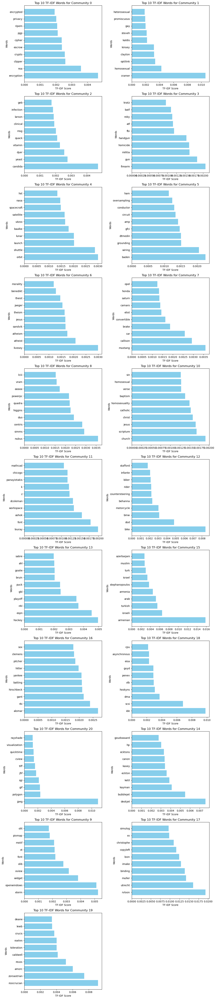

In [173]:
word_document_count = defaultdict(int)
total_communities = len(community_word_count)

for community_id, tokens in community_text.items():
    unique_words_in_community = set(tokens)
    for word in unique_words_in_community:
        word_document_count[word] += 1

community_tfidf_scores = defaultdict(list)

for community_id, tokens in community_text.items():
    word_counts = Counter(tokens)
    tfidf_scores = {}
    
    for word, count in word_counts.items():
        tf = count / len(tokens)
        idf = math.log(total_communities / (1 + word_document_count[word])) 
        tfidf_scores[word] = tf * idf 
    
    sorted_tfidf_scores = dict(sorted(tfidf_scores.items(), key=lambda item: item[1], reverse=True))
    community_tfidf_scores[community_id] = list(sorted_tfidf_scores.items())[:10]

num_communities = len(community_tfidf_scores)
num_rows = math.ceil(num_communities / 2)
plt.figure(figsize=(12, num_rows * 5)) 

for idx, (community_id, tfidf_scores) in enumerate(community_tfidf_scores.items(), 1):
    words, scores = zip(*tfidf_scores) 
    row = (idx - 1) // 2 + 1  
    col = (idx - 1) % 2 + 1   
    plt.subplot(num_rows, 2, idx)
    plt.barh(words, scores, color='skyblue')
    plt.xlabel('TF-IDF Score')
    plt.ylabel('Words')
    plt.title(f"Top 10 TF-IDF Words for Community {community_id}")
    plt.tight_layout()
plt.show()

# Sentiment analysis for the communities

First, we prepare the file with the words and their hapinness scores.

In [174]:
file_path = 'labMIT-1.0.txt'

sentiment_wordlist = {}

with open(file_path, 'r', encoding='utf-8') as f:
    next(f)  
    for line in f:
        parts = line.strip().split('\t') 
        if len(parts) >= 3: 
            word = parts[0].lower()
            try:
                happiness_average = float(parts[2])  
                sentiment_wordlist[word] = happiness_average
            except ValueError:
                print(f"Skipping line: {line.strip()}")

Skipping line: word	happiness_rank	happiness_average	happiness_standard_deviation	twitter_rank	google_rank	nyt_rank	lyrics_rank


Then, we proceed to the sentiment analysis of the communities. 

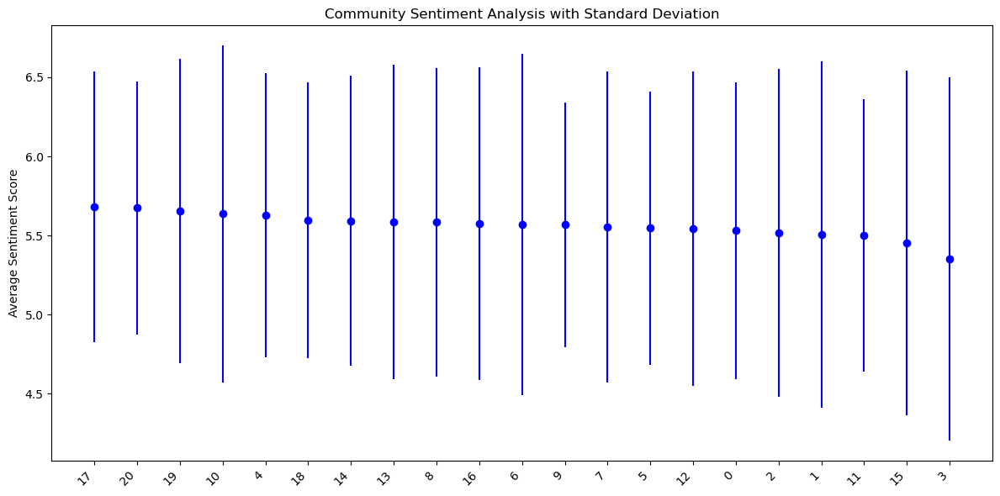


Community Sentiments:
17: 5.683 (±0.854), size: 988
20: 5.673 (±0.802), size: 181024
19: 5.654 (±0.962), size: 10886
10: 5.637 (±1.065), size: 214728
4: 5.627 (±0.899), size: 168552
18: 5.596 (±0.868), size: 37934
14: 5.594 (±0.914), size: 14320
13: 5.587 (±0.992), size: 149162
8: 5.584 (±0.973), size: 53040
16: 5.576 (±0.990), size: 144320
6: 5.568 (±1.079), size: 438451
9: 5.568 (±0.773), size: 94438
7: 5.553 (±0.981), size: 111738
5: 5.547 (±0.861), size: 86536
12: 5.545 (±0.993), size: 116618
0: 5.531 (±0.939), size: 183400
2: 5.517 (±1.036), size: 140804
1: 5.507 (±1.093), size: 82270
11: 5.501 (±0.861), size: 74362
15: 5.453 (±1.087), size: 377808
3: 5.350 (±1.147), size: 286166


In [175]:
community_sentiment_scores = {}

for community_id, tokens in community_text_for_sentiment.items():
    scores = []
    for token in tokens:
        if token in sentiment_wordlist: 
            scores.append(sentiment_wordlist[token])
    
    if scores:
        average_score = np.mean(scores)
        std_score = np.std(scores)
        community_sentiment_scores[community_id] = {
            'sentiment': average_score, 
            'std': std_score, 
            'size': len(scores)
        }
    else:
        community_sentiment_scores[community_id] = {
            'sentiment': 0, 
            'std': 0, 
            'size': 0
        } 

sorted_communities = sorted(community_sentiment_scores.items(), key=lambda x: x[1]['sentiment'], reverse=True)
communities = [item[0] for item in sorted_communities]
sentiments = [item[1]['sentiment'] for item in sorted_communities]
errors = [item[1]['std'] for item in sorted_communities]

plt.figure(figsize=(12, 6))
plt.errorbar(range(len(communities)), sentiments, yerr=errors, fmt='o', color='blue')
plt.xticks(range(len(communities)), communities, rotation=45, ha='right')
plt.title('Community Sentiment Analysis with Standard Deviation')
plt.ylabel('Average Sentiment Score')
plt.tight_layout()
plt.show()

print("\nCommunity Sentiments:")
for community_id, stats in sorted_communities:
    print(f"{community_id}: {stats['sentiment']:.3f} (±{stats['std']:.3f}), size: {stats['size']}")